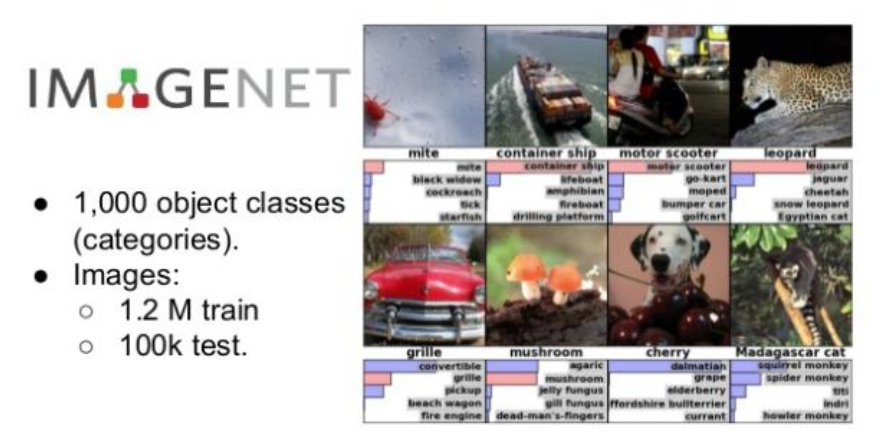

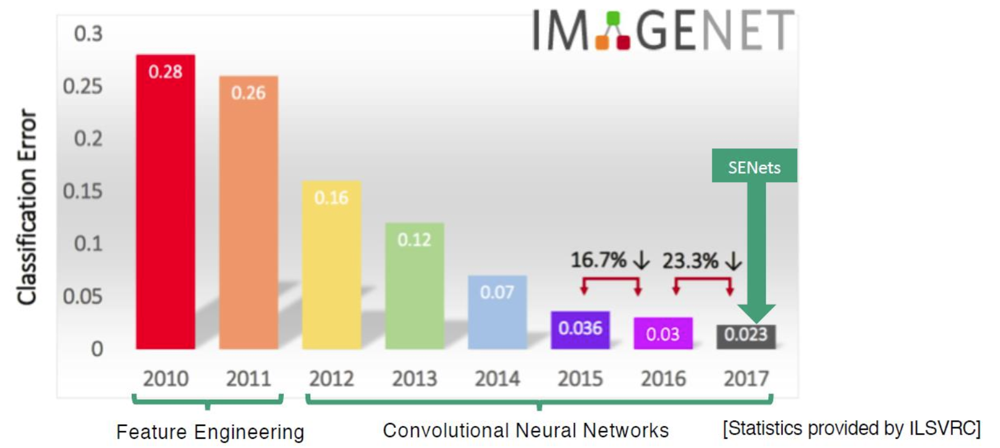

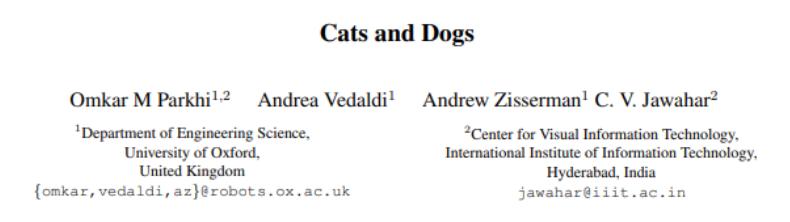

https://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/parkhi12a.pdf

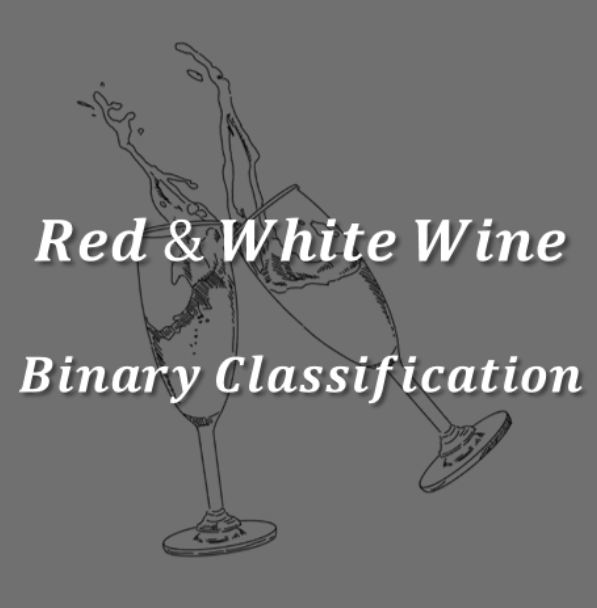

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
red   = pd.read_csv('/content/winequality-red.csv', sep = ';')
white = pd.read_csv('/content/winequality-white.csv', sep = ';')

print(red.head())
print(white.head())

   fixed acidity  volatile acidity  citric acid  ...  sulphates  alcohol  quality
0            7.4              0.70         0.00  ...       0.56      9.4        5
1            7.8              0.88         0.00  ...       0.68      9.8        5
2            7.8              0.76         0.04  ...       0.65      9.8        5
3           11.2              0.28         0.56  ...       0.58      9.8        6
4            7.4              0.70         0.00  ...       0.56      9.4        5

[5 rows x 12 columns]
   fixed acidity  volatile acidity  citric acid  ...  sulphates  alcohol  quality
0            7.0              0.27         0.36  ...       0.45      8.8        6
1            6.3              0.30         0.34  ...       0.49      9.5        6
2            8.1              0.28         0.40  ...       0.44     10.1        6
3            7.2              0.23         0.32  ...       0.40      9.9        6
4            7.2              0.23         0.32  ...       0.40      9.9   

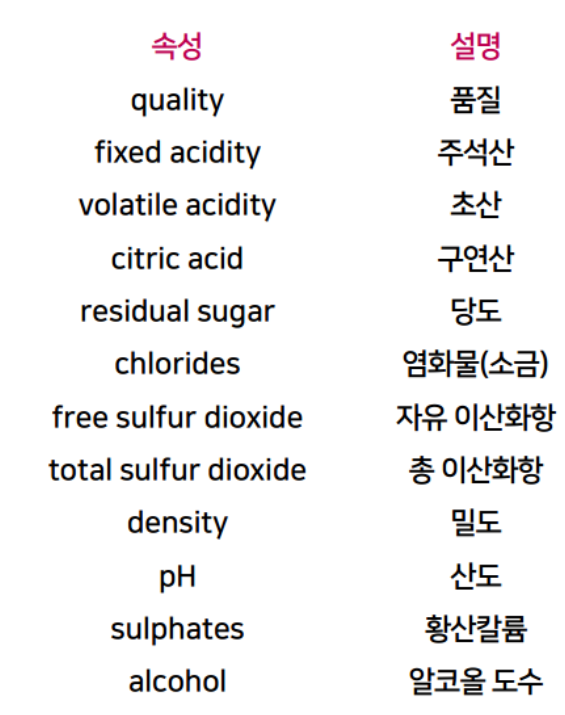

In [ ]:
display(white)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [ ]:
red['type'] = 0 
white['type'] = 1

print(red.head(2))
print(white.head(2))

   fixed acidity  volatile acidity  citric acid  ...  alcohol  quality  type
0            7.4              0.70          0.0  ...      9.4        5     0
1            7.8              0.88          0.0  ...      9.8        5     0

[2 rows x 13 columns]
   fixed acidity  volatile acidity  citric acid  ...  alcohol  quality  type
0            7.0              0.27         0.36  ...      8.8        6     1
1            6.3              0.30         0.34  ...      9.5        6     1

[2 rows x 13 columns]


In [ ]:
wine = pd.concat([red, white])
#print(wine.describe())

In [ ]:
display(wine.describe())

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000


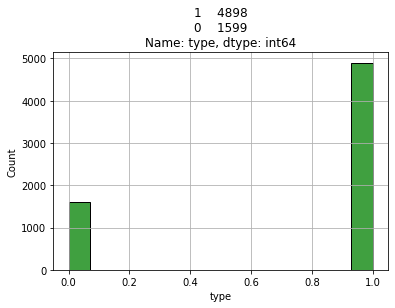

In [ ]:
sns.histplot(wine['type'],color = 'green')
plt.title('{}'.format(wine['type'].value_counts()))

plt.grid()
plt.show()

# f1 - score

In [ ]:
wine_shuffle = wine.sample(frac = 1)
print(wine_shuffle.head())

      fixed acidity  volatile acidity  citric acid  ...  alcohol  quality  type
1066            6.4              0.30         0.51  ...      9.1        6     1
3370            6.0              0.29         0.25  ...     13.2        6     1
500             7.8              0.52         0.25  ...      9.0        6     0
94              5.0              1.02         0.04  ...     10.5        4     0
312             7.8              0.25         0.41  ...     10.0        6     1

[5 rows x 13 columns]


In [ ]:
wine_np = wine_shuffle.to_numpy()
print(type(wine_np))

<class 'numpy.ndarray'>


In [ ]:
print("Total dataset Index : ",len(wine_np))
train_idx = int(len(wine_np) * 0.8)
print("train_idx : ", train_idx)

Total dataset Index :  6497
train_idx :  5197


In [ ]:
train_X, train_Y = wine_np[ : train_idx, : -1 ], wine_np[ :train_idx , -1 ]
test_X,  test_Y  = wine_np[  train_idx: ,: -1 ], wine_np[train_idx : , -1 ]

print(train_X.shape)
print(train_Y.shape)
print(test_X.shape)
print(test_Y.shape)

(5197, 12)
(5197,)
(1300, 12)
(1300,)


In [ ]:
train_X, train_Y = wine_np[ : train_idx, : -1 ], wine_np[ :train_idx , -1 : ]
test_X,  test_Y  = wine_np[  train_idx: ,: -1 ], wine_np[train_idx : , -1 : ]

print(train_X.shape)
print(train_Y.shape)
print(test_X.shape)
print(test_Y.shape)

(5197, 12)
(5197, 1)
(1300, 12)
(1300, 1)


In [ ]:
train_X[0]

array([6.400e+00, 3.000e-01, 5.100e-01, 5.500e+00, 4.800e-02, 6.200e+01,
       1.720e+02, 9.942e-01, 3.080e+00, 4.500e-01, 9.100e+00, 6.000e+00])

In [ ]:
print(train_Y[0])
print(train_Y[1])
print(train_Y[2])

1.0
1.0
0.0


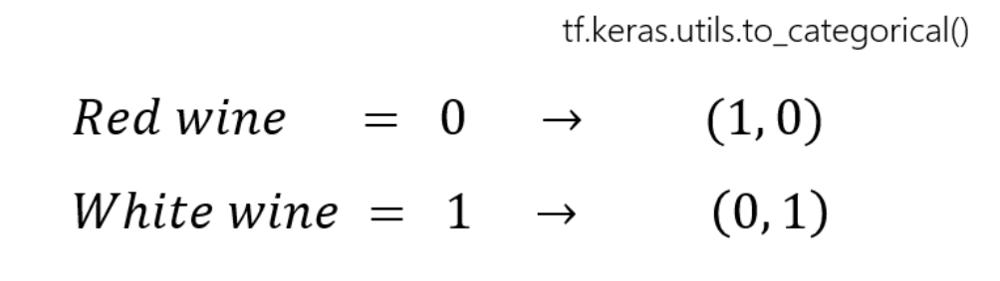

In [ ]:
print("\n Before - to_categorical : \n")
print(train_Y[0])
print(train_Y[1])
print(train_Y[2])

train_Y_to_categorical = tf.keras.utils.to_categorical(train_Y, num_classes = 2)
test_Y_to_categorical  = tf.keras.utils.to_categorical(test_Y, num_classes = 2)

test_Y_to_categorical_5  = tf.keras.utils.to_categorical(test_Y, num_classes = 5)

print("\n After - to_categorical : \n")
print(train_Y_to_categorical[0])
print(train_Y_to_categorical[1])
print(train_Y_to_categorical[2])

print("\n After - to_categorical_5 : \n")
print(test_Y_to_categorical_5[:3])


 Before - to_categorical : 

1.0
1.0
0.0

 After - to_categorical : 

[0. 1.]
[0. 1.]
[1. 0.]

 After - to_categorical_5 : 

[[0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]]


In [ ]:
print(train_Y_to_categorical.shape)
print(test_Y_to_categorical.shape)

(5197, 2)
(1300, 2)


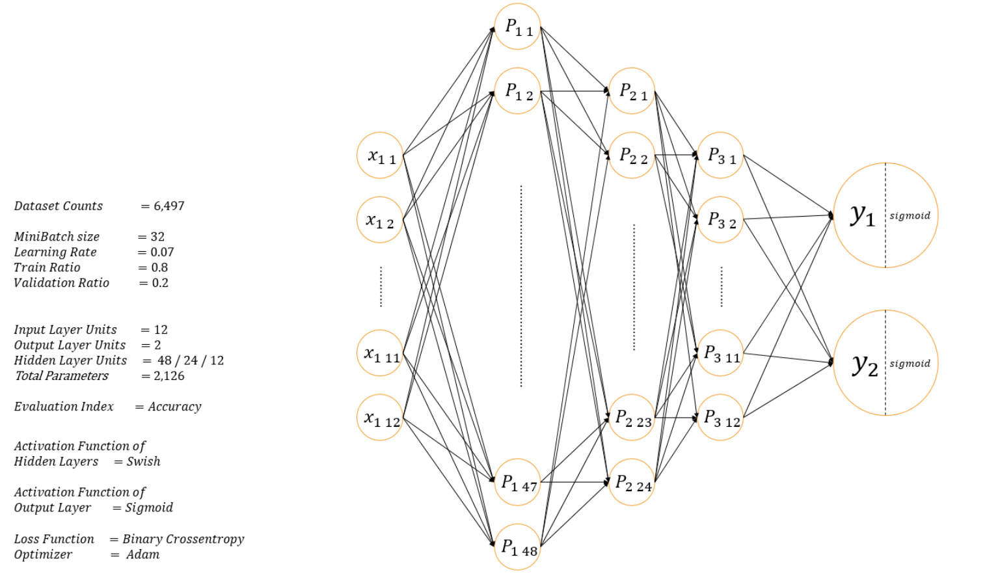

In [ ]:
model_swish_sigmoid = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units = 48, activation = 'swish', 
                                                                 input_shape = (12,)),
                                           tf.keras.layers.Dense(units = 24, activation = 'swish'),
                                           tf.keras.layers.Dense(units = 12, activation = 'swish'),
                                           tf.keras.layers.Dense(units = 2,  activation = 'sigmoid')
]) 

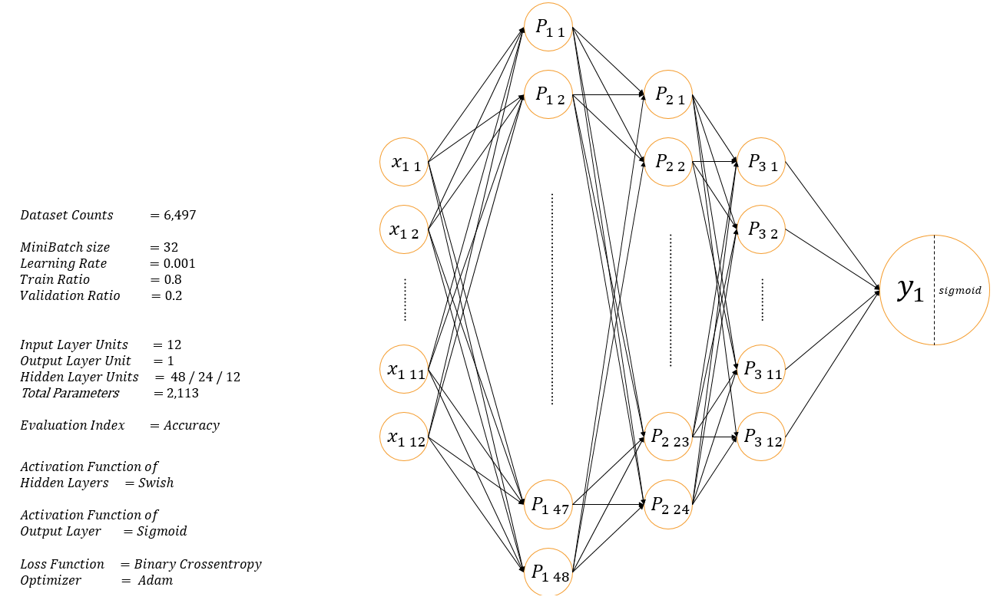

In [ ]:
model_swish_sigmoid_no_onehot = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units = 48, activation = 'swish', 
                                                                 input_shape = (12,)),
                                           tf.keras.layers.Dense(units = 24, activation = 'swish'),
                                           tf.keras.layers.Dense(units = 12, activation = 'swish'),
                                           tf.keras.layers.Dense(units = 1,  activation = 'sigmoid')
]) 

In [ ]:
model_swish_sigmoid.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 48)                624       
_________________________________________________________________
dense_1 (Dense)              (None, 24)                1176      
_________________________________________________________________
dense_2 (Dense)              (None, 12)                300       
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 26        
Total params: 2,126
Trainable params: 2,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_swish_sigmoid_no_onehot.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 48)                624       
_________________________________________________________________
dense_5 (Dense)              (None, 24)                1176      
_________________________________________________________________
dense_6 (Dense)              (None, 12)                300       
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 13        
Total params: 2,113
Trainable params: 2,113
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_swish_sigmoid.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.07),
                            loss = 'binary_crossentropy',
                            metrics = ['accuracy'])

In [ ]:
model_swish_sigmoid_no_onehot.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
                                      loss = 'binary_crossentropy',
                                      metrics = ['accuracy'])

In [ ]:
print(train_Y.shape)
print(train_X.shape)

(5197, 1)
(5197, 12)


In [ ]:
history = model_swish_sigmoid.fit(train_X, train_Y_to_categorical, epochs = 50, batch_size = 32, 
                                  validation_split = 0.2,
                                  callbacks = [tf.keras.callbacks.EarlyStopping(patience = 5, 
                                                                                monitor='val_loss')])

Epoch 1/50
130/130 [==============================] - 1s 3ms/step - loss: 0.4588 - accuracy: 0.9168 - val_loss: 0.1679 - val_accuracy: 0.9413
Epoch 2/50
130/130 [==============================] - 0s 2ms/step - loss: 0.1996 - accuracy: 0.9322 - val_loss: 0.2862 - val_accuracy: 0.8856
Epoch 3/50
130/130 [==============================] - 0s 2ms/step - loss: 0.1509 - accuracy: 0.9500 - val_loss: 0.1779 - val_accuracy: 0.9269
Epoch 4/50
130/130 [==============================] - 0s 2ms/step - loss: 0.1677 - accuracy: 0.9418 - val_loss: 0.1113 - val_accuracy: 0.9615
Epoch 5/50
130/130 [==============================] - 0s 2ms/step - loss: 0.1060 - accuracy: 0.9656 - val_loss: 0.0738 - val_accuracy: 0.9721
Epoch 6/50
130/130 [==============================] - 0s 2ms/step - loss: 0.1603 - accuracy: 0.9452 - val_loss: 0.2189 - val_accuracy: 0.9183
Epoch 7/50
130/130 [==============================] - 0s 2ms/step - loss: 0.3060 - accuracy: 0.9141 - val_loss: 0.2552 - val_accuracy: 0.9567
Epoch 

In [ ]:
history = model_swish_sigmoid_no_onehot.fit(train_X, train_Y, epochs = 50, batch_size = 32, 
                                            validation_split = 0.2)

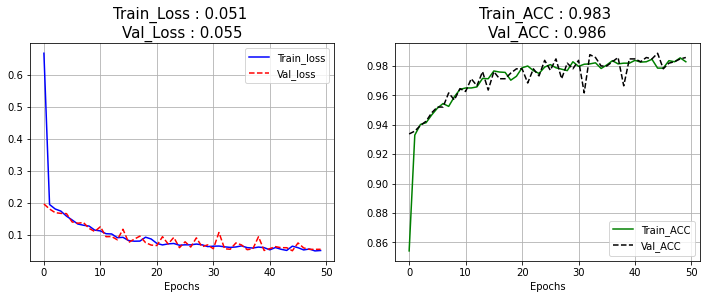

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy     = history.history['accuracy']

val_loss = history.history['val_loss']
loss     = history.history['loss']

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

plt.plot(history.history['loss'], 'b-',      label = 'Train_loss')
plt.plot(history.history['val_loss'], 'r--', label = 'Val_loss')

plt.xlabel('Epochs')

plt.title("Train_Loss : {:.3f} \nVal_Loss : {:.3f}".format(loss[-1], val_loss[-1]),
          fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1,2,2)

plt.plot(history.history['accuracy'], 'g-',      label = 'Train_ACC')
plt.plot(history.history['val_accuracy'], 'k--', label = 'Val_ACC')
plt.xlabel('Epochs')

plt.title("Train_ACC : {:.3f} \nVal_ACC : {:.3f}".format(accuracy[-1], val_accuracy[-1]),
          fontsize = 15)

plt.legend()
plt.grid()
plt.show()

In [ ]:
val_loss = history.history['val_loss']
loss     = history.history['loss']

In [ ]:
loss

[0.5130227208137512,
 0.1977899968624115,
 0.1688569039106369,
 0.14633187651634216,
 0.12788210809230804,
 0.1210101768374443,
 0.1193493977189064,
 0.11550033837556839,
 0.10596364736557007,
 0.12260641902685165,
 0.1476513296365738,
 0.12284410744905472,
 0.2589681148529053]

In [ ]:
model_swish_sigmoid.evaluate(test_X, test_Y_to_categorical)

41/41 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.9385


[0.34263163805007935, 0.9384615421295166]

In [ ]:
model_swish_sigmoid_no_onehot.evaluate(test_X, test_Y)

41/41 [==============================] - 0s 1ms/step - loss: 0.0442 - accuracy: 0.9892


[0.044183969497680664, 0.989230751991272]

In [ ]:
pred_Y = model_swish_sigmoid.predict(test_X)
print(np.round(pred_Y[:20], 2))

[[0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.01 1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.91 0.11]
 [1.   0.  ]
 [1.   0.  ]
 [0.   1.  ]
 [1.   0.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [0.   1.  ]
 [1.   0.  ]]


In [ ]:
pred_Y = model_swish_sigmoid_no_onehot.predict(test_X)
print(np.round(pred_Y[:20], 2))

[[1.  ]
 [1.  ]
 [0.99]
 [0.98]
 [1.  ]
 [1.  ]
 [1.  ]
 [0.01]
 [0.  ]
 [0.  ]
 [1.  ]
 [0.  ]
 [1.  ]
 [1.  ]
 [1.  ]
 [0.99]
 [1.  ]
 [0.97]
 [1.  ]
 [0.  ]]


In [ ]:
pred_Y = np.round(pred_Y)
print(pred_Y[:20])

[[0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]]


In [ ]:
print(test_Y_to_categorical[:20])

[[0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]]


# 실제값 0.00  | 1.00 
# 예측값 0.67  | 0.13
# MSE  - 0  | 1

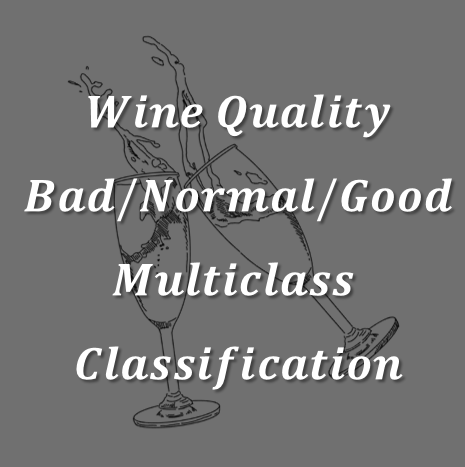

In [ ]:
print(wine['quality'].describe())
print(wine['quality'].value_counts())

count    6497.000000
mean        5.818378
std         0.873255
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         9.000000
Name: quality, dtype: float64
6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64


In [ ]:
import matplotlib.pyplot as plt


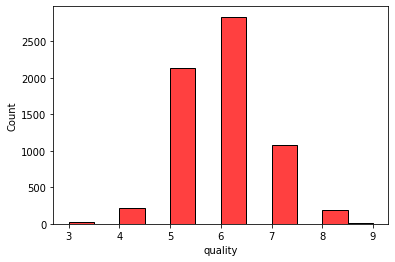

In [ ]:
sns.histplot(wine['quality'], color = 'red', binwidth = 0.5)
plt.show()

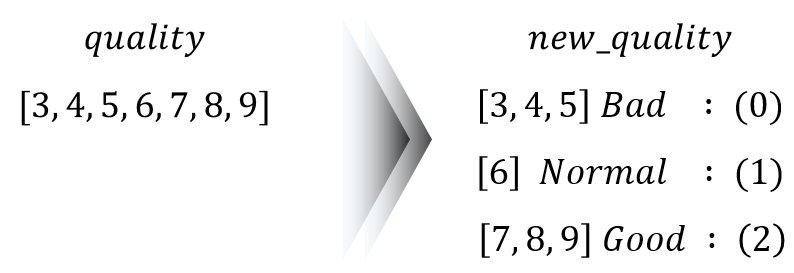

In [ ]:
wine.loc[wine['quality'] <= 5, 'new_quality'] = 0
wine.loc[wine['quality'] == 6, 'new_quality'] = 1
wine.loc[wine['quality'] >= 7, 'new_quality'] = 2

In [ ]:
print(wine['new_quality'].describe())
print(wine['new_quality'].value_counts())

count    6497.000000
mean        0.829614
std         0.731124
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: new_quality, dtype: float64
1.0    2836
0.0    2384
2.0    1277
Name: new_quality, dtype: int64


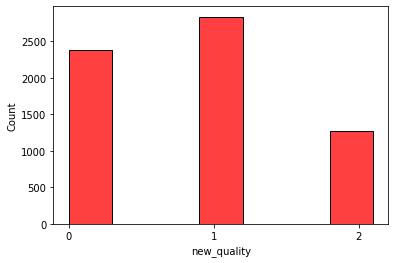

In [ ]:
sns.histplot(wine['new_quality'], color = 'red', binwidth = 0.3)
plt.xticks(ticks=[0,2,1])

plt.show()

In [ ]:
wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type,new_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0,1.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1,1.0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1,0.0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1,1.0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1,2.0


In [ ]:
del wine['quality']
display(wine)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type,new_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0,1.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1,1.0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,1,0.0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1,1.0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1,2.0


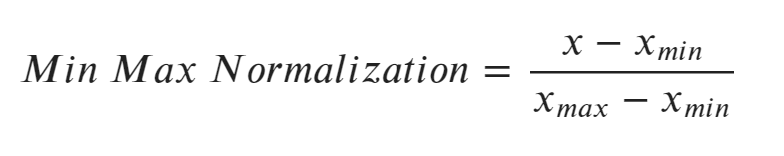

In [ ]:
wine_norm = (wine - wine.min()) / (wine.max() - wine.min())

display(wine_norm)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type,new_quality
0,0.297521,0.413333,0.000000,0.019939,0.111296,0.034722,0.064516,0.206092,0.612403,0.191011,0.202899,0.0,0.0
1,0.330579,0.533333,0.000000,0.030675,0.147841,0.083333,0.140553,0.186813,0.372093,0.258427,0.260870,0.0,0.0
2,0.330579,0.453333,0.024096,0.026074,0.137874,0.048611,0.110599,0.190669,0.418605,0.241573,0.260870,0.0,0.0
3,0.611570,0.133333,0.337349,0.019939,0.109635,0.055556,0.124424,0.209948,0.341085,0.202247,0.260870,0.0,0.5
4,0.297521,0.413333,0.000000,0.019939,0.111296,0.034722,0.064516,0.206092,0.612403,0.191011,0.202899,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,0.198347,0.086667,0.174699,0.015337,0.049834,0.079861,0.198157,0.077694,0.426357,0.157303,0.463768,1.0,0.5
4894,0.231405,0.160000,0.216867,0.113497,0.063123,0.194444,0.373272,0.150183,0.333333,0.134831,0.231884,1.0,0.0
4895,0.223140,0.106667,0.114458,0.009202,0.053156,0.100694,0.241935,0.104685,0.209302,0.134831,0.202899,1.0,0.5
4896,0.140496,0.140000,0.180723,0.007669,0.021595,0.065972,0.239631,0.030461,0.480620,0.089888,0.695652,1.0,1.0


In [ ]:
wine_shuffle = wine_norm.sample(frac=1)
wine_np      = wine_shuffle.to_numpy()

In [ ]:
train_ratio = 0.8

train_idx = int(len(wine_np) * train_ratio)
print("train_idx : ", train_idx)

train_idx :  5197


In [ ]:
train_X, train_Y = wine_np[ : train_idx,  : -1 ], wine_np[   :train_idx  ,  -1 :   ]
test_X, test_Y   = wine_np[  train_idx :, : -1 ], wine_np[  train_idx :  , -1  :   ]

train_Y_to_categorical= tf.keras.utils.to_categorical(train_Y, num_classes=3)
test_Y_to_categorical = tf.keras.utils.to_categorical(test_Y,  num_classes=3)

In [ ]:
print(train_X.shape)
print(train_Y_to_categorical.shape)
print(test_X.shape)
print(test_Y_to_categorical.shape)

(5197, 12)
(5197, 3)
(1300, 12)
(1300, 3)


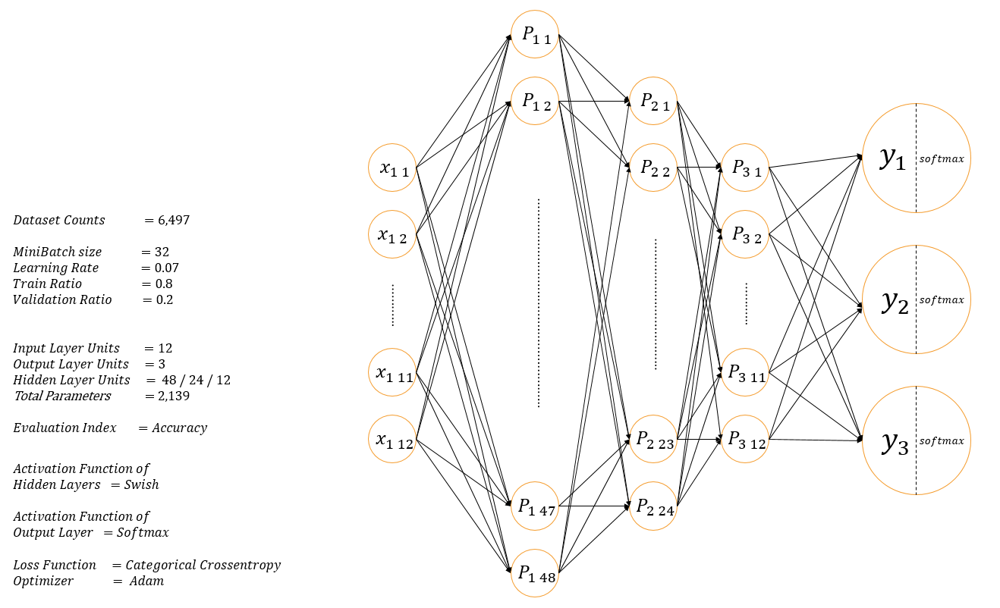

In [ ]:
model_swish_softmax = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units=48, activation='swish', input_shape = (12,)),
                                           tf.keras.layers.Dense(units=24, activation='swish'),
                                           tf.keras.layers.Dense(units=12, activation='swish'),
                                           tf.keras.layers.Dense(units=3,  activation='softmax')
])

In [ ]:
model_swish_softmax.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 48)                624       
_________________________________________________________________
dense_17 (Dense)             (None, 24)                1176      
_________________________________________________________________
dense_18 (Dense)             (None, 12)                300       
_________________________________________________________________
dense_19 (Dense)             (None, 3)                 39        
Total params: 2,139
Trainable params: 2,139
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_swish_softmax.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                            loss    = 'categorical_crossentropy',
                            metrics = ['accuracy'])

In [ ]:
history = model_swish_softmax.fit(train_X,
                                  train_Y_to_categorical,
                                  epochs = 100, 
                                  batch_size = 32,
                                  validation_split = 0.2,
                                  callbacks = [tf.keras.callbacks.EarlyStopping(patience=3,
                                                                                monitor='val_loss')])

Epoch 1/100
130/130 [==============================] - 1s 5ms/step - loss: 0.6882 - accuracy: 0.7828 - val_loss: 0.5532 - val_accuracy: 0.7962
Epoch 2/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.8076 - val_loss: 0.4898 - val_accuracy: 0.7962
Epoch 3/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4330 - accuracy: 0.8109 - val_loss: 0.4457 - val_accuracy: 0.7942
Epoch 4/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4148 - accuracy: 0.8140 - val_loss: 0.4306 - val_accuracy: 0.7981
Epoch 5/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4055 - accuracy: 0.8181 - val_loss: 0.4229 - val_accuracy: 0.8019
Epoch 6/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4020 - accuracy: 0.8174 - val_loss: 0.4307 - val_accuracy: 0.7913
Epoch 7/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8196 - val_loss: 0.4137 - val_accuracy: 0.8192

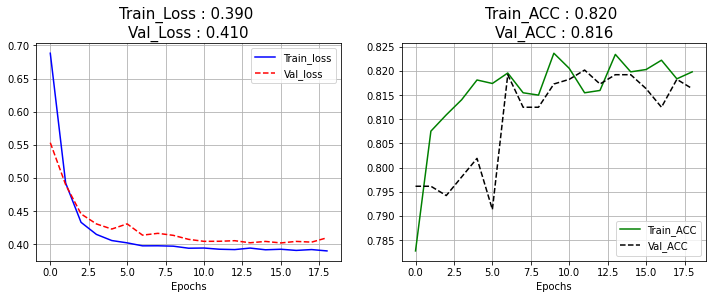

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy     = history.history['accuracy']

val_loss = history.history['val_loss']
loss     = history.history['loss']

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

plt.plot(history.history['loss'], 'b-',      label = 'Train_loss')
plt.plot(history.history['val_loss'], 'r--', label = 'Val_loss')

plt.xlabel('Epochs')

plt.title("Train_Loss : {:.3f} \nVal_Loss : {:.3f}".format(loss[-1], val_loss[-1]),
          fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1,2,2)

plt.plot(history.history['accuracy'], 'g-',      label = 'Train_ACC')
plt.plot(history.history['val_accuracy'], 'k--', label = 'Val_ACC')
plt.xlabel('Epochs')

plt.title("Train_ACC : {:.3f} \nVal_ACC : {:.3f}".format(accuracy[-1], val_accuracy[-1]),
          fontsize = 15)

plt.legend()
plt.grid()
plt.show()

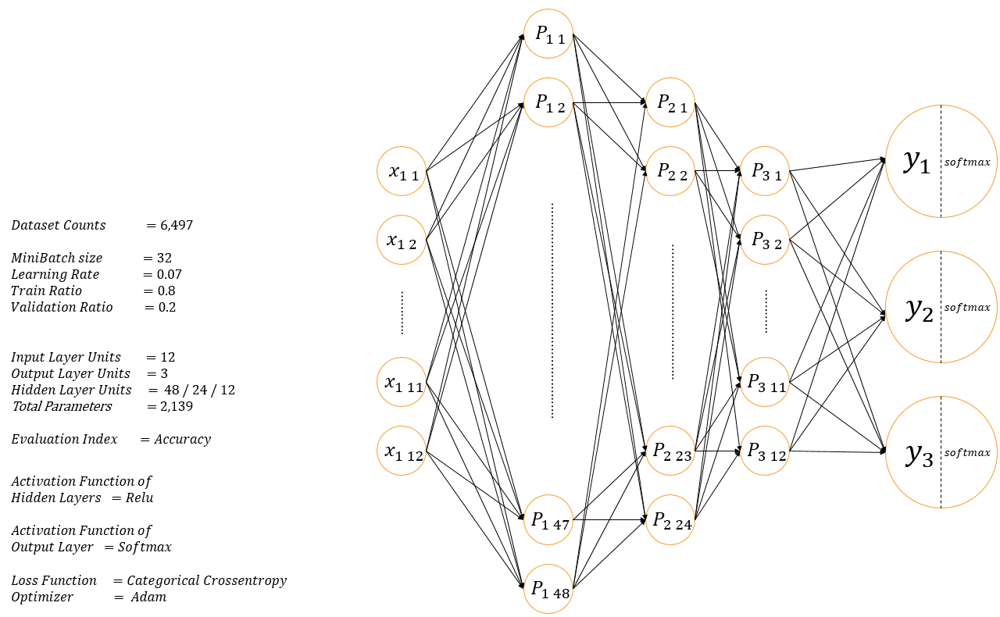

In [ ]:
model_relu_softmax = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units=48, activation='relu', input_shape = (12,)),
                                           tf.keras.layers.Dense(units=24, activation='relu'),
                                           tf.keras.layers.Dense(units=12, activation='relu'),
                                           tf.keras.layers.Dense(units=3,  activation='softmax')
])

In [ ]:
model_relu_softmax.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                            loss    = 'categorical_crossentropy',
                            metrics = ['accuracy'])

In [ ]:
history = model_relu_softmax.fit(train_X,
                                  train_Y_to_categorical,
                                  epochs = 100, 
                                  batch_size = 32,
                                  validation_split = 0.2,
                                  callbacks = [tf.keras.callbacks.EarlyStopping(patience=3,
                                                                                monitor='val_loss')])

Epoch 1/100
130/130 [==============================] - 1s 3ms/step - loss: 0.6137 - accuracy: 0.8076 - val_loss: 0.4979 - val_accuracy: 0.7962
Epoch 2/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.8085 - val_loss: 0.4425 - val_accuracy: 0.7971
Epoch 3/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4059 - accuracy: 0.8155 - val_loss: 0.4271 - val_accuracy: 0.8087
Epoch 4/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3999 - accuracy: 0.8191 - val_loss: 0.4204 - val_accuracy: 0.7894
Epoch 5/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3915 - accuracy: 0.8225 - val_loss: 0.4197 - val_accuracy: 0.7952
Epoch 6/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8251 - val_loss: 0.4279 - val_accuracy: 0.7808
Epoch 7/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3854 - accuracy: 0.8196 - val_loss: 0.4145 - val_accuracy: 0.8087

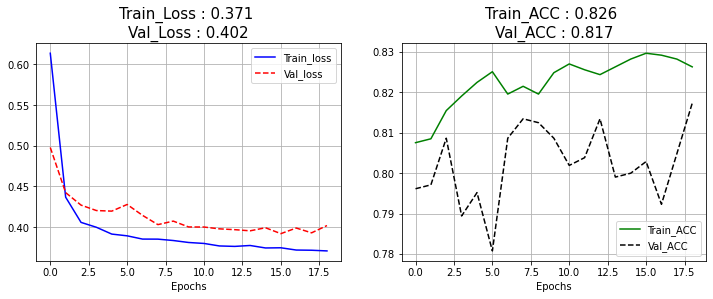

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy     = history.history['accuracy']

val_loss = history.history['val_loss']
loss     = history.history['loss']

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

plt.plot(history.history['loss'], 'b-',      label = 'Train_loss')
plt.plot(history.history['val_loss'], 'r--', label = 'Val_loss')

plt.xlabel('Epochs')

plt.title("Train_Loss : {:.3f} \nVal_Loss : {:.3f}".format(loss[-1], val_loss[-1]),
          fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1,2,2)

plt.plot(history.history['accuracy'], 'g-',      label = 'Train_ACC')
plt.plot(history.history['val_accuracy'], 'k--', label = 'Val_ACC')
plt.xlabel('Epochs')

plt.title("Train_ACC : {:.3f} \nVal_ACC : {:.3f}".format(accuracy[-1], val_accuracy[-1]),
          fontsize = 15)

plt.legend()
plt.grid()
plt.show()

In [ ]:
print(model_swish_softmax.evaluate(test_X, test_Y_to_categorical))

41/41 [==============================] - 0s 1ms/step - loss: 0.4104 - accuracy: 0.8108
[0.41043373942375183, 0.810769259929657]


In [ ]:
print(model_relu_softmax.evaluate(test_X, test_Y_to_categorical))

41/41 [==============================] - 0s 1ms/step - loss: 0.4070 - accuracy: 0.8162
[0.4070114493370056, 0.8161538243293762]


In [ ]:
pred_Y = model_relu_softmax.predict(test_X)
pred_Y = np.round(pred_Y,2)

In [ ]:
print(pred_Y[:5])
print(test_Y_to_categorical[:5])

[[0.92 0.07 0.  ]
 [0.91 0.09 0.  ]
 [0.98 0.02 0.  ]
 [0.99 0.01 0.  ]
 [0.78 0.22 0.  ]]
[[1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]]


In [ ]:
pred_Y = np.argmax(pred_Y, axis = 1)
test_Y_to_categorical = np.argmax(test_Y_to_categorical, axis = 1)

print(pred_Y[:10])
print(test_Y_to_categorical[:10])

[0 0 0 0 0 0 0 0 0 0]
[0 1 0 1 0 1 0 0 0 0]


In [ ]:
result = np.equal(pred_Y, test_Y_to_categorical)
acc = np.mean(result)

print("Acc : {:.3f} %".format(acc * 100))

Acc : 81.615 %


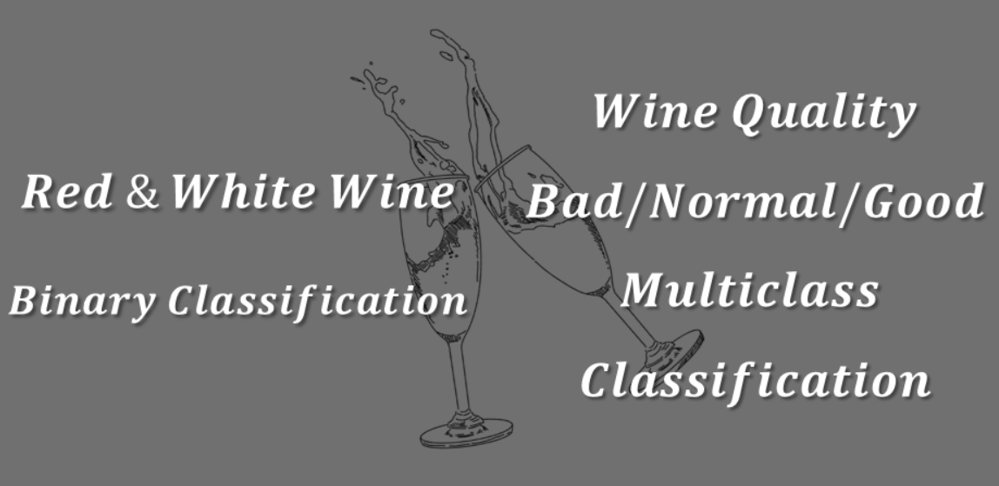

# 10 : 13  분 시작 ~ 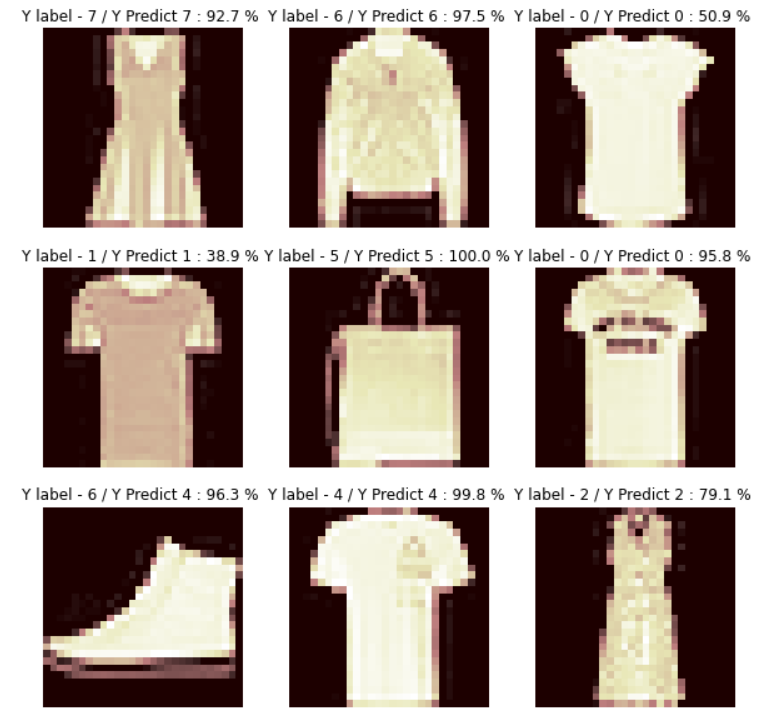

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_X, train_Y), (test_X, test_Y) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


In [ ]:
print(len(train_X), len(test_X))

60000 10000


In [ ]:
train_Y[:5]

array([9, 0, 0, 3, 0], dtype=uint8)

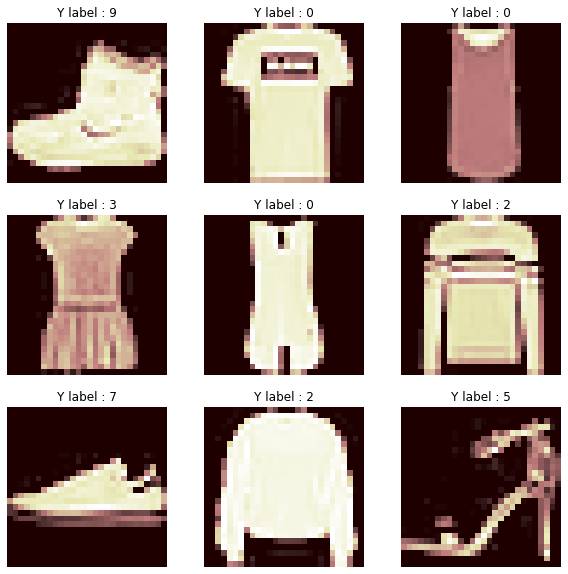

In [ ]:
plt.figure(figsize=(10,10))

for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.title("Y label : {}".format(train_Y[i]))
    plt.axis('off')
    plt.imshow(train_X[i], cmap='pink')

plt.show()

In [ ]:
print("train_X[0].shape : ", train_X[0].shape)
print("train_X[0].ndim : ", train_X[0].ndim)

train_X[0].shape :  (28, 28)
train_X[0].ndim :  2


In [ ]:
print("train_X.shape : ", train_X.shape)
print("train_X.ndim : ", train_X.ndim)

train_X.shape :  (60000, 28, 28)
train_X.ndim :  3


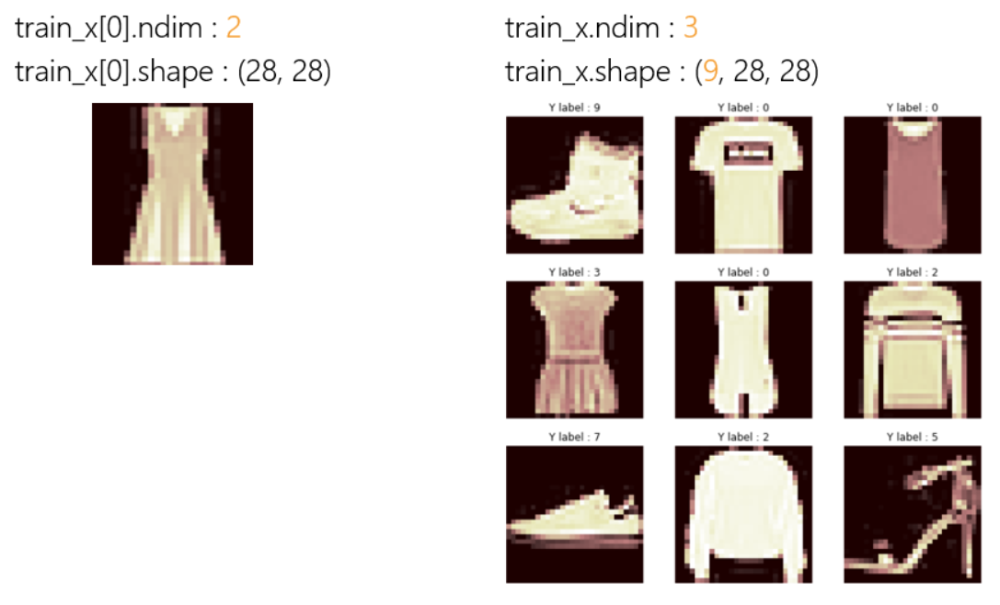

In [ ]:
print(np.min(train_X))
print(np.max(train_X))

0
255


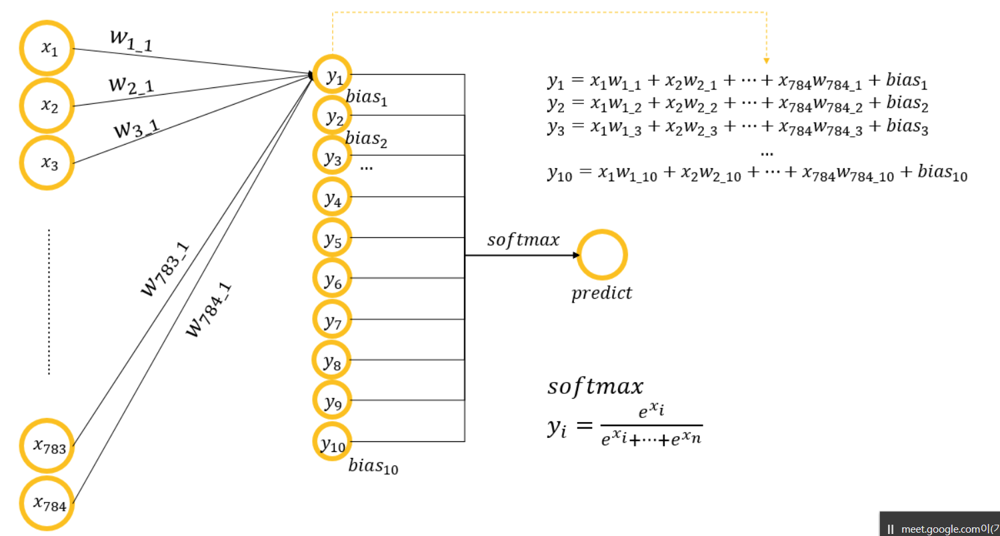

In [ ]:
train_X_norm = train_X / 255.0
print("np.min(train_X_norm) : ", np.min(train_X_norm))
print("np.max(train_X_norm) : ", np.max(train_X_norm))

test_X_norm = test_X / 255.0
print("np.min(test_X_norm) : ", np.min(test_X_norm))
print("np.max(test_X_norm) : ", np.max(test_X_norm))

np.min(train_X_norm) :  0.0
np.max(train_X_norm) :  1.0
np.min(test_X_norm) :  0.0
np.max(test_X_norm) :  1.0


In [ ]:
Fmnist_Relu_DNN = tf.keras.Sequential([
                                       tf.keras.layers.Flatten(input_shape = (28,28)),
                                       tf.keras.layers.Dense(units = 128, activation='relu'),
                                       tf.keras.layers.Dense(units = 64, activation='relu'),
                                       tf.keras.layers.Dense(units = 32, activation='relu'),
                                       tf.keras.layers.Dense(units = 10, activation='softmax'),
]) 

In [ ]:
Fmnist_Relu_DNN.compile(optimizer=tf.keras.optimizers.Adam(),
                        loss = 'sparse_categorical_crossentropy',
                        metrics = ['accuracy'])

In [ ]:
Fmnist_Relu_DNN.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense_24 (Dense)             (None, 128)               100480    
_________________________________________________________________
dense_25 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_26 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_27 (Dense)             (None, 10)                330       
Total params: 111,146
Trainable params: 111,146
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history =  Fmnist_Relu_DNN.fit(train_X_norm, train_Y, epochs = 200, validation_split=0.2,
                               batch_size = 32,
                               callbacks = [tf.keras.callbacks.EarlyStopping(patience=3)])

Epoch 1/200
1500/1500 [==============================] - 5s 3ms/step - loss: 0.5345 - accuracy: 0.8103 - val_loss: 0.4140 - val_accuracy: 0.8523
Epoch 2/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3888 - accuracy: 0.8580 - val_loss: 0.3797 - val_accuracy: 0.8586
Epoch 3/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3477 - accuracy: 0.8715 - val_loss: 0.3447 - val_accuracy: 0.8752
Epoch 4/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3214 - accuracy: 0.8807 - val_loss: 0.3489 - val_accuracy: 0.8763
Epoch 5/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3043 - accuracy: 0.8878 - val_loss: 0.3429 - val_accuracy: 0.8729
Epoch 6/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.2867 - accuracy: 0.8935 - val_loss: 0.3480 - val_accuracy: 0.8727
Epoch 7/200
1500/1500 [==============================] - 5s 3ms/step - loss: 0.2761 - accuracy: 0.8972 - val_loss: 0.3609 - val_ac

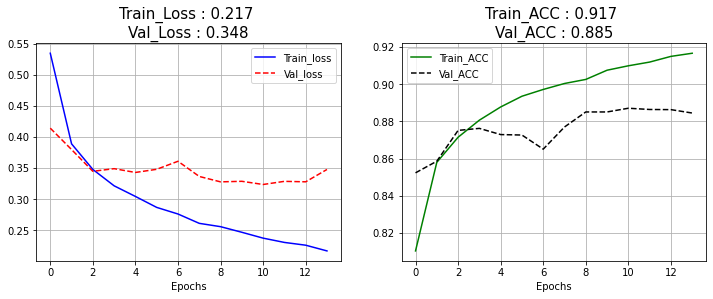

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy     = history.history['accuracy']

val_loss = history.history['val_loss']
loss     = history.history['loss']

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

plt.plot(history.history['loss'], 'b-',      label = 'Train_loss')
plt.plot(history.history['val_loss'], 'r--', label = 'Val_loss')

plt.xlabel('Epochs')

plt.title("Train_Loss : {:.3f} \nVal_Loss : {:.3f}".format(loss[-1], val_loss[-1]),
          fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1,2,2)

plt.plot(history.history['accuracy'], 'g-',      label = 'Train_ACC')
plt.plot(history.history['val_accuracy'], 'k--', label = 'Val_ACC')
plt.xlabel('Epochs')

plt.title("Train_ACC : {:.3f} \nVal_ACC : {:.3f}".format(accuracy[-1], val_accuracy[-1]),
          fontsize = 15)

plt.legend()
plt.grid()
plt.show()

# Dropout

In [ ]:
Fmnist_Relu_DNN.evaluate(test_X_norm, test_Y)

313/313 [==============================] - 1s 2ms/step - loss: 0.3694 - accuracy: 0.8799


[0.36940446496009827, 0.8798999786376953]

In [ ]:
Fmnist_Relu_DNN.save('Fmnist_Relu_DNN.h5')

In [ ]:
pred_Y = Fmnist_Relu_DNN.predict(test_X[[13]])
print("pred_Y : ", pred_Y)
pred_Y = np.round(pred_Y,3)
print("pred_Y : ", pred_Y)

pred_Y :  [[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
pred_Y :  [[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


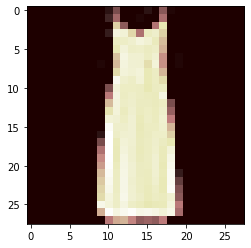

Probability Ditribution : 
 [[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]] %

Pred Y : 3 Test Y : 3 -> Correct True 


In [ ]:
plt.imshow(test_X[13], cmap='pink')
plt.show()

pred_Y_argmax = np.argmax(pred_Y)
correct = np.equal(pred_Y_argmax, test_Y[13])

print("Probability Ditribution : \n {} %".format(pred_Y))
print("\nPred Y : {} Test Y : {} -> Correct {} ".\
      format(pred_Y_argmax, test_Y[13], correct))

# 여기부터 추가 실습 코드 입니다 ~ 

In [ ]:
Fmnist_Relu_DNN.save('Fmnist_Relu_DNN.h5')

In [ ]:
pred_Y = Fmnist_Relu_DNN.predict(test_X)
pred_Y = np.round(pred_Y,3)

pred_Y_argmax = np.argmax(pred_Y,axis = 1)
print(pred_Y_argmax[:10])

[9 2 1 1 6 1 4 6 5 7]


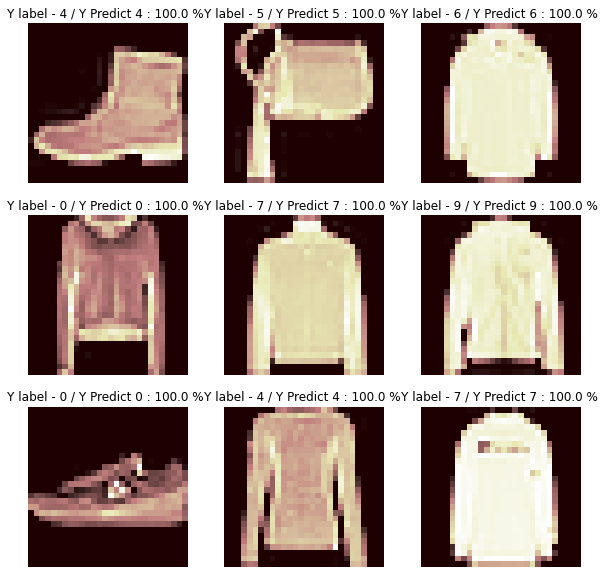

In [ ]:
plt.figure(figsize=(10,10))

for i in range(9):
    plt.subplot(3,3,i+1)

    i = np.random.choice(range(0,10000))
    plt.title("Y label-{} / Y Predict {} : {:.3f} %".\
              format(test_Y[i], pred_Y_argmax[i], np.max(pred_Y_round[:][i])))
    plt.axis('off')
    plt.imshow(test_X[i])

plt.show()

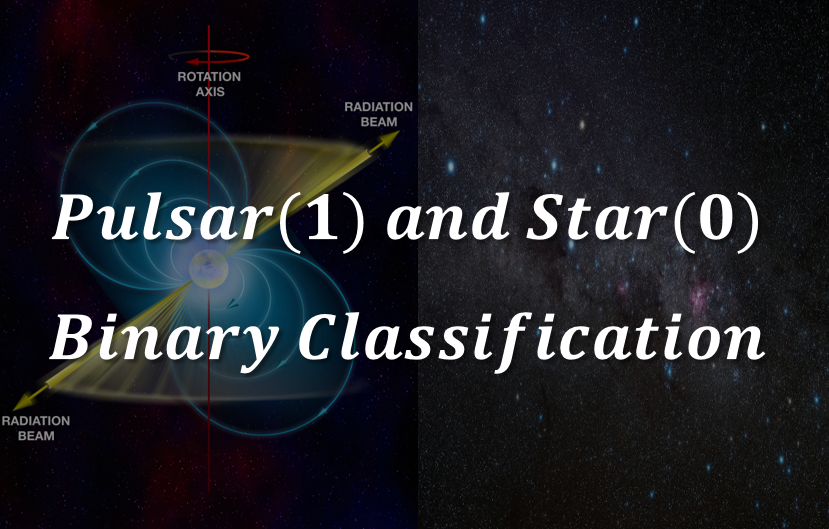

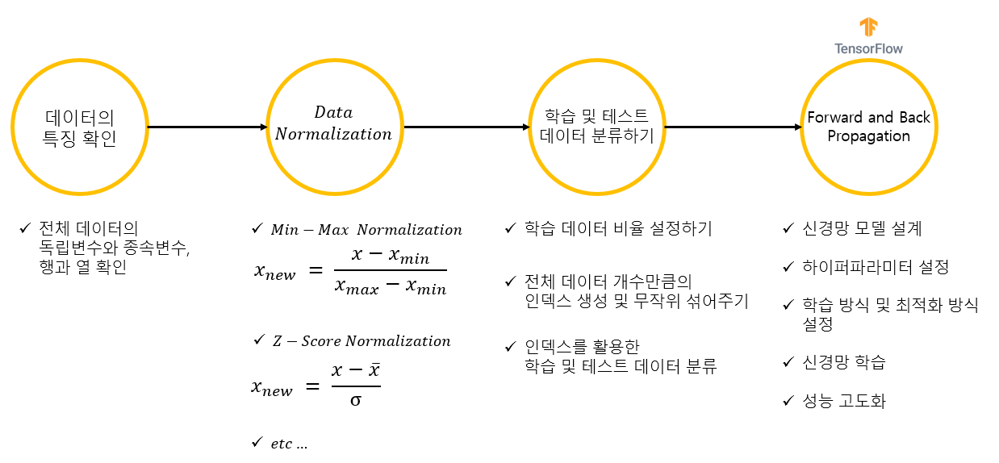

In [ ]:
import csv
import numpy as np
import pandas as pd
import tensorflow as tf


In [ ]:
df = pd.read_csv('/content/pulsar_stars.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0    Mean of the integrated profile                17898 non-null  float64
 1    Standard deviation of the integrated profile  17898 non-null  float64
 2    Excess kurtosis of the integrated profile     17898 non-null  float64
 3    Skewness of the integrated profile            17898 non-null  float64
 4    Mean of the DM-SNR curve                      17898 non-null  float64
 5    Standard deviation of the DM-SNR curve        17898 non-null  float64
 6    Excess kurtosis of the DM-SNR curve           17898 non-null  float64
 7    Skewness of the DM-SNR curve                  17898 non-null  float64
 8   target_class                                   17898 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 1.2 MB


In [ ]:
df.describe()

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,target_class
count,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000
mean,111.079968,46.549532,0.477857,1.770279,12.614400,26.326515,8.303556,104.857709,0.091574
std,25.652935,6.843189,1.064040,6.167913,29.472897,19.470572,4.506092,106.514540,0.288432
min,5.812500,24.772042,-1.876011,-1.791886,0.213211,7.370432,-3.139270,-1.976976,0.000000
25%,100.929688,42.376018,0.027098,-0.188572,1.923077,14.437332,5.781506,34.960504,0.000000
50%,115.078125,46.947479,0.223240,0.198710,2.801839,18.461316,8.433515,83.064556,0.000000
75%,127.085938,51.023202,0.473325,0.927783,5.464256,28.428104,10.702959,139.309331,0.000000
max,192.617188,98.778911,8.069522,68.101622,223.392140,110.642211,34.539844,1191.000837,1.000000


In [ ]:
print("target_class : ", set(df['target_class']))

target_class :  {0, 1}


In [ ]:
with open('/content/pulsar_stars.csv') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)
    rows = []
    for row in csvreader:
        rows.append(row)

data = np.asarray(rows, dtype='float32')
input_cnt, output_cnt = 8, 1

In [ ]:
print(data[:][0])

[140.5625      55.68378     -0.23457141  -0.6996484    3.1998327
  19.110426     7.9755316   74.242226     0.        ]


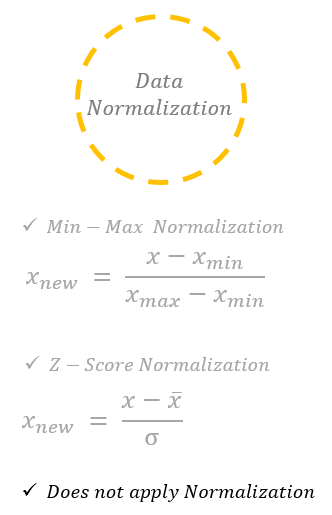

In [ ]:
train_ratio = 0.8
mb_size     = 32

test_begin_index = int(data.shape[0] * train_ratio)
print(data.shape[0])
print("test_begin_index : ", test_begin_index)

17898
test_begin_index :  14318


In [ ]:
shuffle_map = np.arange(data.shape[0])

np.random.seed(1234)
np.random.shuffle(shuffle_map)
print(shuffle_map[:5])

[ 9375  1570 15443 14077  6079]


In [ ]:
train_data = data[shuffle_map[:test_begin_index]]
test_data  = data[shuffle_map[test_begin_index:]]

print(train_data.shape)
print(test_data.shape)

(14318, 9)
(3580, 9)


In [ ]:
train_x, train_y = train_data[: , :-output_cnt], train_data[: , -output_cnt : ]
test_x,  test_y  = test_data[: , :-output_cnt] , test_data[: , -output_cnt : ]

print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(14318, 8)
(14318, 1)
(3580, 8)
(3580, 1)


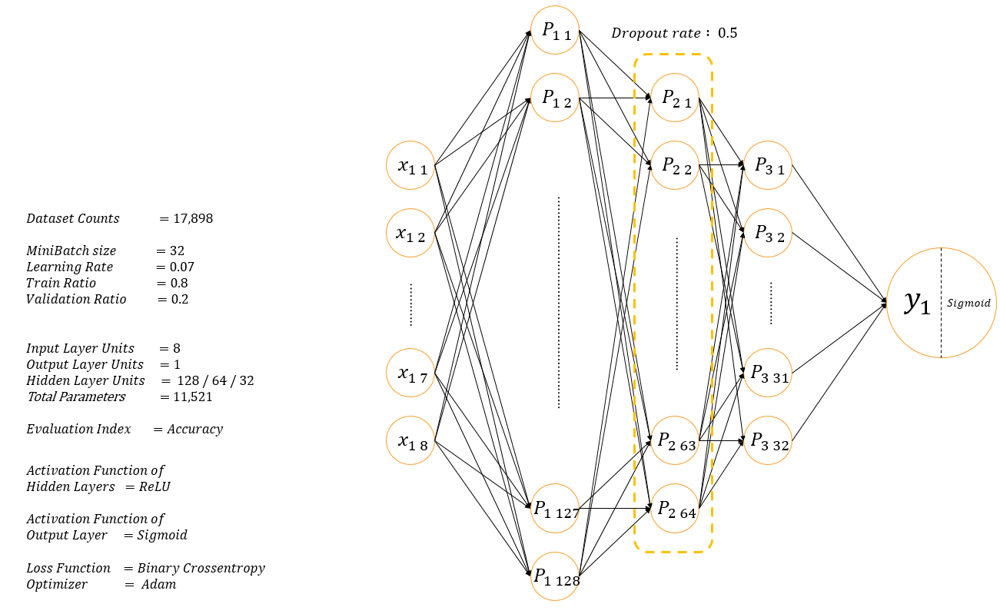

In [ ]:
pulsar_DNN_drop_sigmoid = tf.keras.Sequential([
                                               tf.keras.layers.Dense(units=128, activation='relu', input_shape = [8,]),
                                               tf.keras.layers.Dense(units=64, activation='relu'),
                                               tf.keras.layers.Dropout(rate = 0.5),
                                               tf.keras.layers.Dense(units=32, activation='relu'),
                                               tf.keras.layers.Dense(units=1, activation='sigmoid')
])

In [ ]:
pulsar_DNN_drop_sigmoid.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               1152      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 11,521
Trainable params: 11,521
Non-trainable params: 0
_________________________________________________________________


In [ ]:
pulsar_DNN_sigmoid = tf.keras.Sequential([
                                               tf.keras.layers.Dense(units=128, activation='relu', input_shape = [8,]),
                                               tf.keras.layers.Dense(units=64, activation='relu'),
                                               #tf.keras.layers.Dropout(rate = 0.5),
                                               tf.keras.layers.Dense(units=32, activation='relu'),
                                               tf.keras.layers.Dense(units=1, activation='sigmoid')
])

In [ ]:
pulsar_DNN_sigmoid.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 128)               1152      
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 33        
Total params: 11,521
Trainable params: 11,521
Non-trainable params: 0
_________________________________________________________________


In [ ]:
pulsar_DNN_drop_sigmoid.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                                loss = 'binary_crossentropy',
                                metrics = ['accuracy'])

In [ ]:
history = pulsar_DNN_drop_sigmoid.fit(train_x, train_y,
                                      batch_size = 32,
                                      epochs     = 25,
                                      validation_split = 0.2,
                                      callbacks = [tf.keras.callbacks.EarlyStopping(patience=3)])

Epoch 1/25
358/358 [==============================] - 1s 2ms/step - loss: 0.1685 - accuracy: 0.9157 - val_loss: 0.1498 - val_accuracy: 0.9260
Epoch 2/25
358/358 [==============================] - 1s 1ms/step - loss: 0.1655 - accuracy: 0.9226 - val_loss: 0.1490 - val_accuracy: 0.9256
Epoch 3/25
358/358 [==============================] - 1s 1ms/step - loss: 0.1667 - accuracy: 0.9231 - val_loss: 0.1487 - val_accuracy: 0.9267
Epoch 4/25
358/358 [==============================] - 1s 1ms/step - loss: 0.1633 - accuracy: 0.9248 - val_loss: 0.1395 - val_accuracy: 0.9281
Epoch 5/25
358/358 [==============================] - 1s 1ms/step - loss: 0.1327 - accuracy: 0.9373 - val_loss: 0.1067 - val_accuracy: 0.9784
Epoch 6/25
358/358 [==============================] - 1s 2ms/step - loss: 0.1259 - accuracy: 0.9699 - val_loss: 0.1052 - val_accuracy: 0.9766
Epoch 7/25
358/358 [==============================] - 1s 2ms/step - loss: 0.1210 - accuracy: 0.9720 - val_loss: 0.0990 - val_accuracy: 0.9780
Epoch 

In [ ]:
pulsar_DNN_drop_sigmoid.save('pulsar_DNN_drop_sigmoid.h5')

In [ ]:
import matplotlib.pyplot as plt


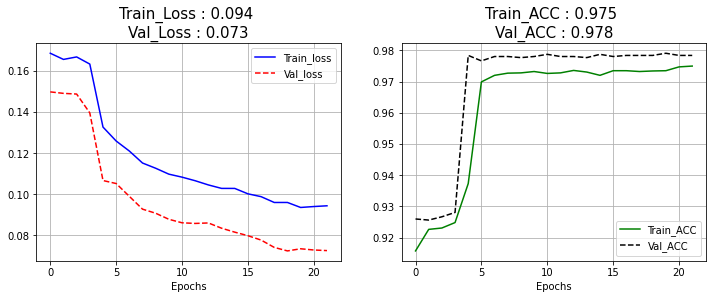

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy     = history.history['accuracy']

val_loss = history.history['val_loss']
loss     = history.history['loss']

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

plt.plot(history.history['loss'], 'b-',      label = 'Train_loss')
plt.plot(history.history['val_loss'], 'r--', label = 'Val_loss')

plt.xlabel('Epochs')

plt.title("Train_Loss : {:.3f} \nVal_Loss : {:.3f}".format(loss[-1], val_loss[-1]),
          fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1,2,2)

plt.plot(history.history['accuracy'], 'g-',      label = 'Train_ACC')
plt.plot(history.history['val_accuracy'], 'k--', label = 'Val_ACC')
plt.xlabel('Epochs')

plt.title("Train_ACC : {:.3f} \nVal_ACC : {:.3f}".format(accuracy[-1], val_accuracy[-1]),
          fontsize = 15)

plt.legend()
plt.grid()
plt.show()

In [ ]:
pred_Y = pulsar_DNN_drop_sigmoid.predict(test_x)
pred_Y = np.round(pred_Y)
print(pred_Y[:20])

[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]


In [ ]:
print(pd.DataFrame(pred_Y).value_counts())
print(pd.DataFrame(test_y).value_counts())

0.0    3269
1.0     311
dtype: int64
0.0    3258
1.0     322
dtype: int64


# 혼동 행렬 (Confusion Matrix)

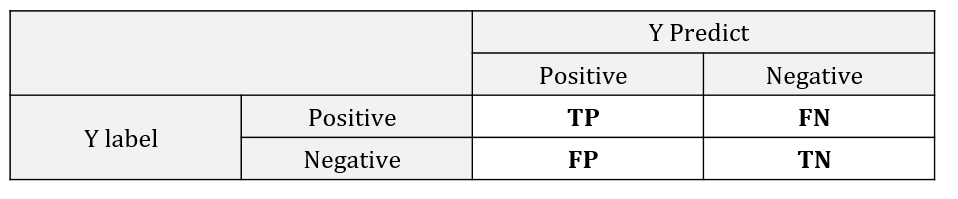

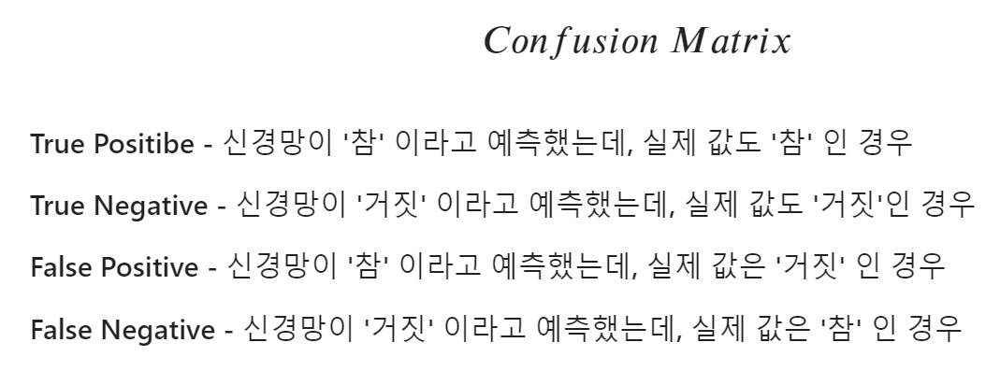

In [ ]:
# 예측값을 참(1)으로 예측했냐? 
est_yes = np.greater(pred_Y, 0.5)
print("est_yes : \n", est_yes[:5])

# 실제값을 참(1)으로 예측했냐?
ans_yes = np.greater(test_y, 0.5)
print("ans_yes : \n", ans_yes[:5])

est_yes : 
 [[False]
 [False]
 [False]
 [False]
 [False]]
ans_yes : 
 [[False]
 [False]
 [False]
 [False]
 [False]]


In [ ]:
est_no = np.logical_not(est_yes)
print("est_no : \n", est_no[:5])
ans_no = np.logical_not(ans_yes)
print("ans_no : \n",ans_no[:5])

est_no : 
 [[ True]
 [ True]
 [ True]
 [ True]
 [ True]]
ans_no : 
 [[ True]
 [ True]
 [ True]
 [ True]
 [ True]]


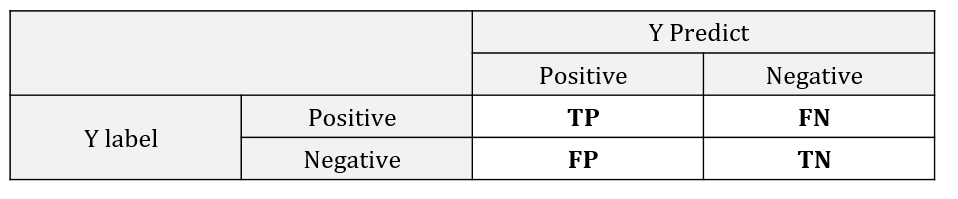

In [ ]:
np.logical_and(x1, x2)

In [ ]:
tp = np.sum(np.logical_and(est_yes, ans_yes))
print("TP : ", tp)

tn = np.sum(np.logical_and(est_no, ans_no))
print("TN : ", tn)

fp = np.sum(np.logical_and(ans_no, est_yes))
print("FP : ", fp)

fn = np.sum(np.logical_and(ans_yes, est_no))
print("FN : ", fn)

TP :  274
TN :  3221
FP :  37
FN :  48


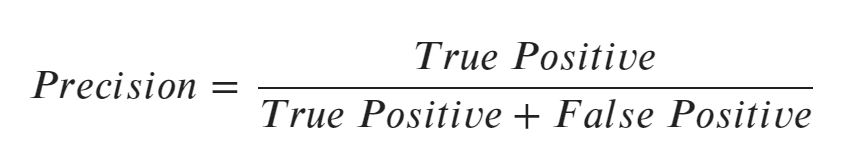

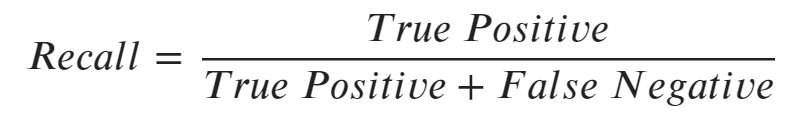

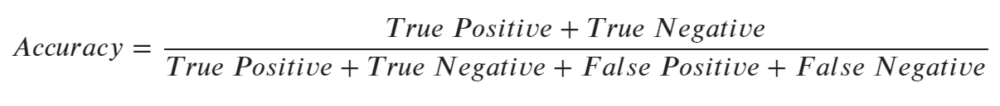

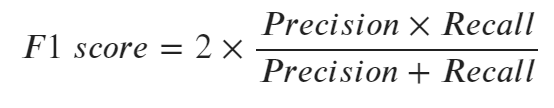

In [ ]:
accuracy = safe_div((tp + tn), (tp + tn + fp + fn))
print("accuracy : ", accuracy)

precision = safe_div((tp) , (tp + fp))
print("precision : ", precision)

recall = safe_div((tp) , (tp + fn))
print("recall : ", recall)

f1 = 2 * safe_div((recall * precision), (recall + precision))
print("F1-Score : ", f1)

accuracy :  0.9762569832402235
precision :  0.8810289389067524
recall :  0.8509316770186336
F1-Score :  0.8657187993680885


In [ ]:
precision = tp / (tp + fp)
print("precision :", precision) 

recall = tp / (tp + fn)
print("recall : ", recall)

precision : nan
recall :  0.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in long_scalars
  """Entry point for launching an IPython kernel.


In [ ]:
# 안전한 나눗셈 함수 만들기
def safe_div(p,q):
    p, q = float(p), float(q)

    if np.abs(q) < 1.0e-20:
        return np.sign(p)
    return p / q

In [ ]:
np.sign(-123)

-1

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [ ]:
print(test_y[:, 0])
print(pred_Y[:, 0])

[0. 0. 0. ... 0. 0. 0.]
[0. 0. 0. ... 0. 0. 0.]


In [ ]:
print(confusion_matrix(test_y[:, 0], pred_Y[:, 0]))
print("accuracy_score : ", accuracy_score(test_y[:, 0], pred_Y[:, 0]))
print("precision_score : ", precision_score(test_y[:, 0], pred_Y[:, 0]))
print("recall_score : ", recall_score(test_y[:, 0], pred_Y[:, 0]))
print("f1_score : ", f1_score(test_y[:, 0], pred_Y[:, 0]))

[[3221   37]
 [  48  274]]
accuracy_score :  0.9762569832402235
precision_score :  0.8810289389067524
recall_score :  0.8509316770186336
f1_score :  0.8657187993680885


# from sklearn.metrics import classification_report

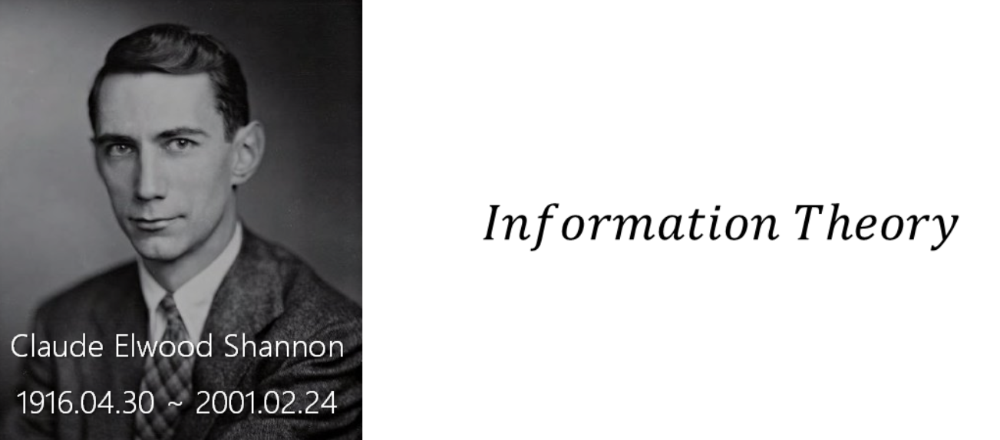

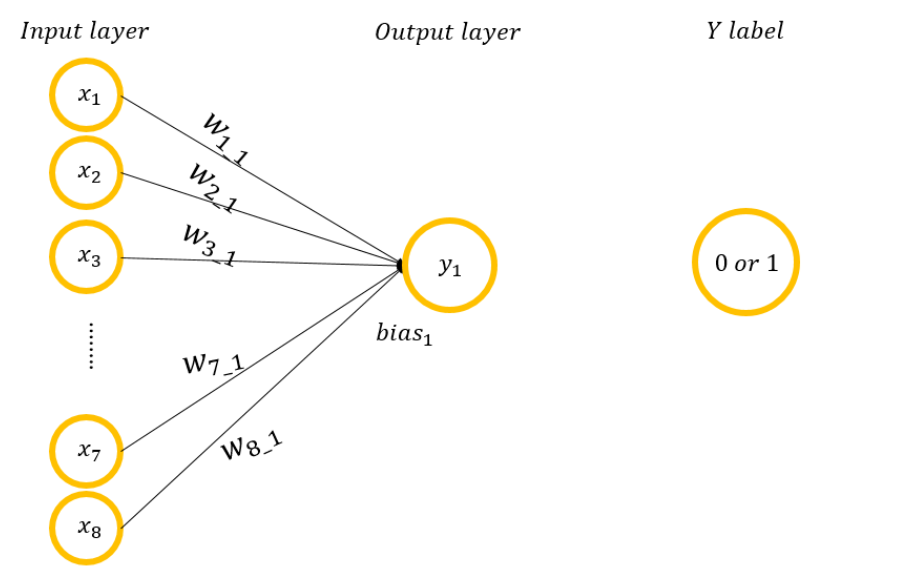

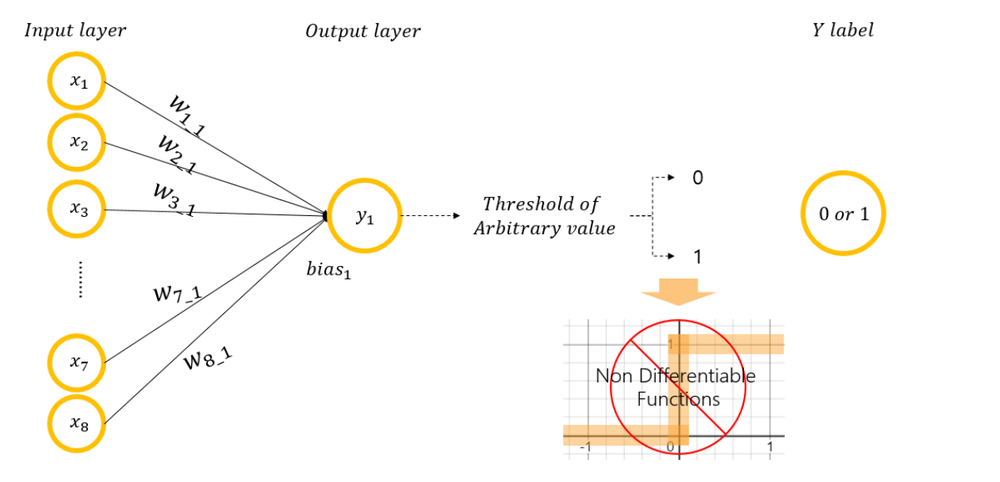

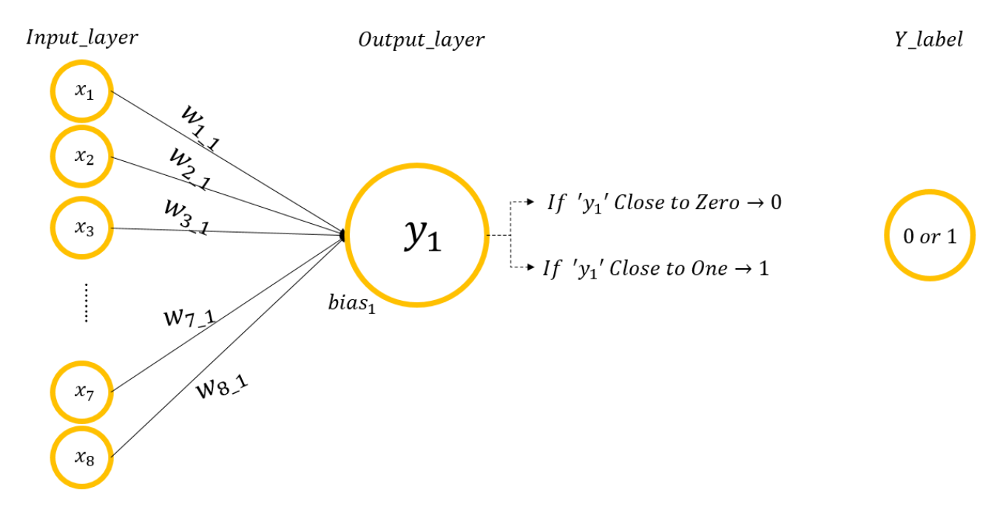

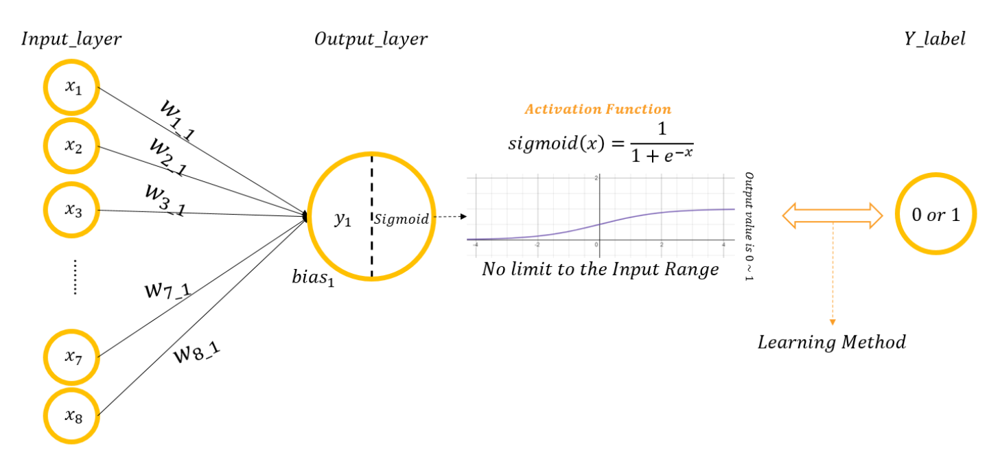

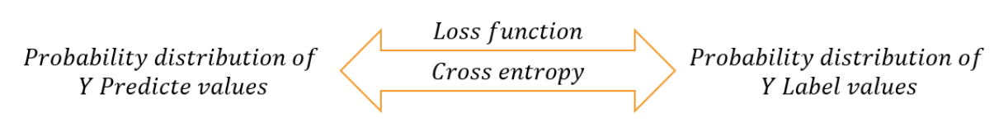

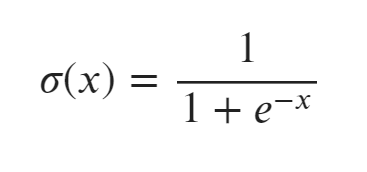

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
x = np.arange(0,10,1)
e_rows = []

for i in x:
    e = np.exp(i)
    e_rows.append(e)
print(e_rows)

[1.0, 2.718281828459045, 7.38905609893065, 20.085536923187668, 54.598150033144236, 148.4131591025766, 403.4287934927351, 1096.6331584284585, 2980.9579870417283, 8103.083927575384]


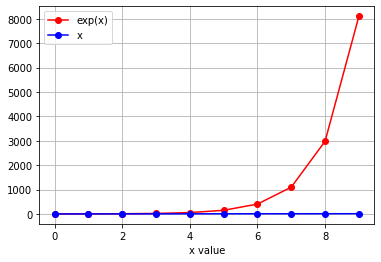

In [ ]:
plt.plot(e_rows, '-o', color ='red', label = 'exp(x)')
plt.plot(x, '-o', color = 'blue', label = 'x')

plt.xlabel('x value')
plt.grid()
plt.legend()

plt.show()

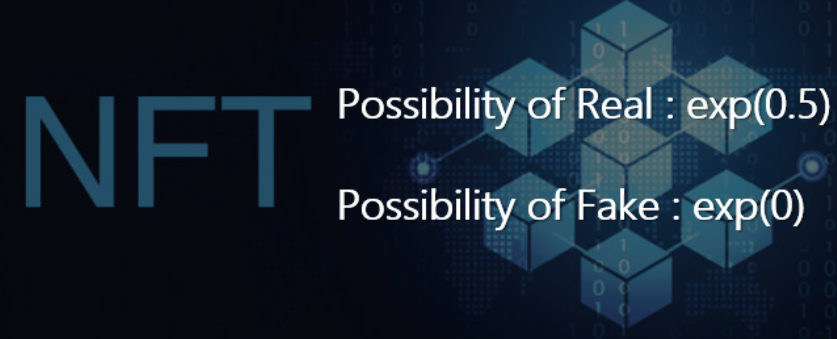

In [ ]:
def func_exp(x):
    return np.round(np.exp(x),3)

A_real = func_exp(0.5)
A_fake = func_exp(0)

print("A_real : ", A_real)
print("A_fake : ", A_fake)

A_real :  1.649
A_fake :  1.0


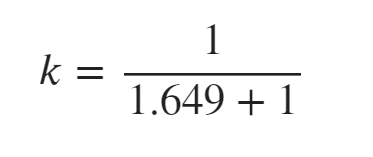

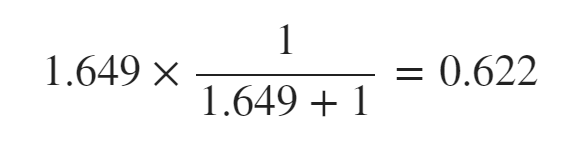

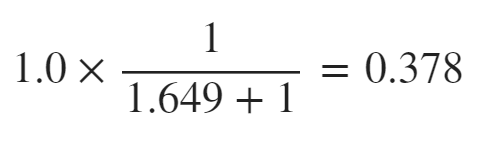

In [ ]:
k = 1 / (A_real + A_fake)
print("A_real 확률 : " , np.round(A_real * k,3))
print("A_fake 확률 : " , np.round(A_fake * k,3))

A_real 확률 :  0.622
A_fake 확률 :  0.378


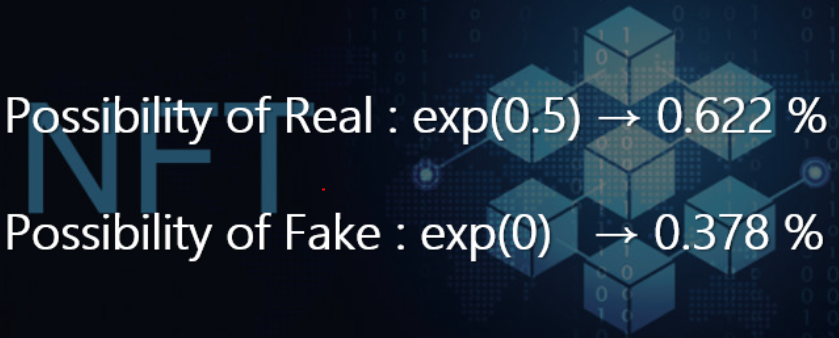

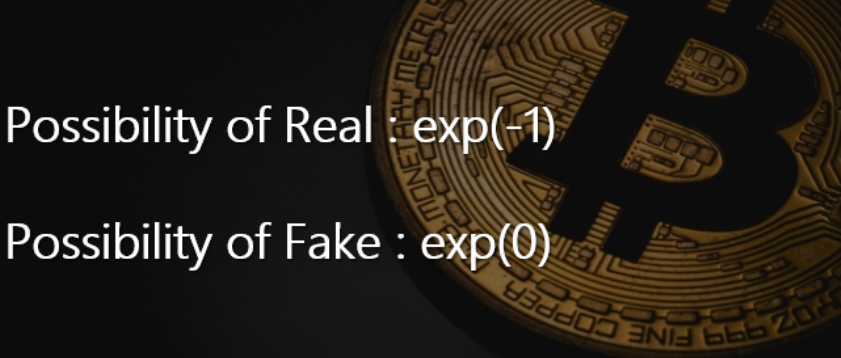

In [ ]:
A_real = func_exp(-1)
A_fake = func_exp(0)

print("A_real : ", A_real)
print("A_fake : ", A_fake)

A_real :  0.368
A_fake :  1.0


In [ ]:
k = 1 / (A_real + A_fake)

In [ ]:

print("A_real 확률 : " , np.round(A_real * k,3))
print("A_fake 확률 : " , np.round(A_fake * k,3))

A_real 확률 :  0.269
A_fake 확률 :  0.731


# $$ Probability \ of \ Real = 0.368 × \frac{1}{0.368 + 1} = 0.269$$
# $$ Probability \ of \ Fake = 1.0 × \frac{1}{0.368 + 1} = 0.731 $$

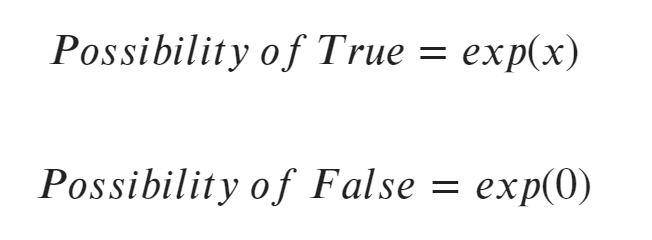

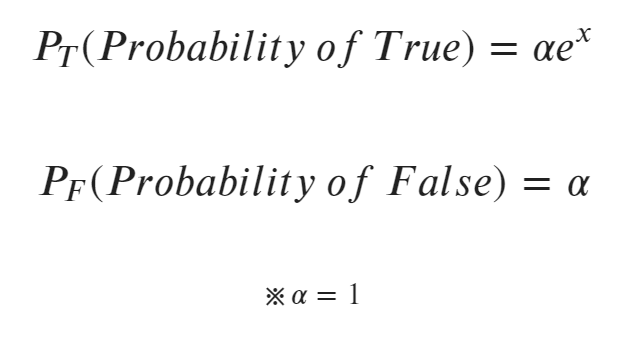

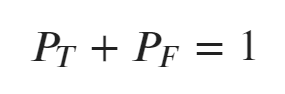

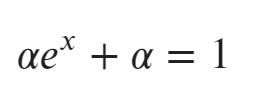

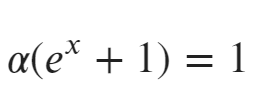

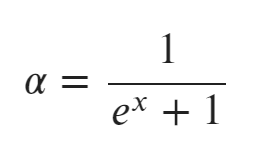

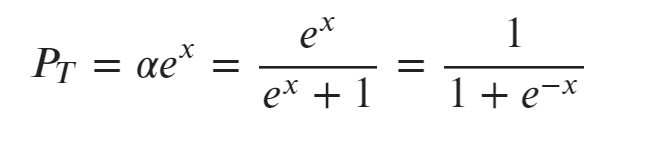

# ▲ 각 분자와 분모에 e^(x)를 나눠주면 됩니다.  

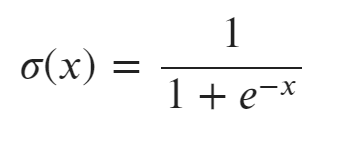

In [2]:
import numpy as np
def sigmoid(x):
    pred_Y =1/(1 + np.exp(-x))
    return np.round(pred_Y*100,3)

for x in range(-20,20,2):
    P_T = sigmoid(x)
    print("x value : {} -> {} %".format(x, P_T))

x value : -20 -> 0.0 %
x value : -18 -> 0.0 %
x value : -16 -> 0.0 %
x value : -14 -> 0.0 %
x value : -12 -> 0.001 %
x value : -10 -> 0.005 %
x value : -8 -> 0.034 %
x value : -6 -> 0.247 %
x value : -4 -> 1.799 %
x value : -2 -> 11.92 %
x value : 0 -> 50.0 %
x value : 2 -> 88.08 %
x value : 4 -> 98.201 %
x value : 6 -> 99.753 %
x value : 8 -> 99.966 %
x value : 10 -> 99.995 %
x value : 12 -> 99.999 %
x value : 14 -> 100.0 %
x value : 16 -> 100.0 %
x value : 18 -> 100.0 %


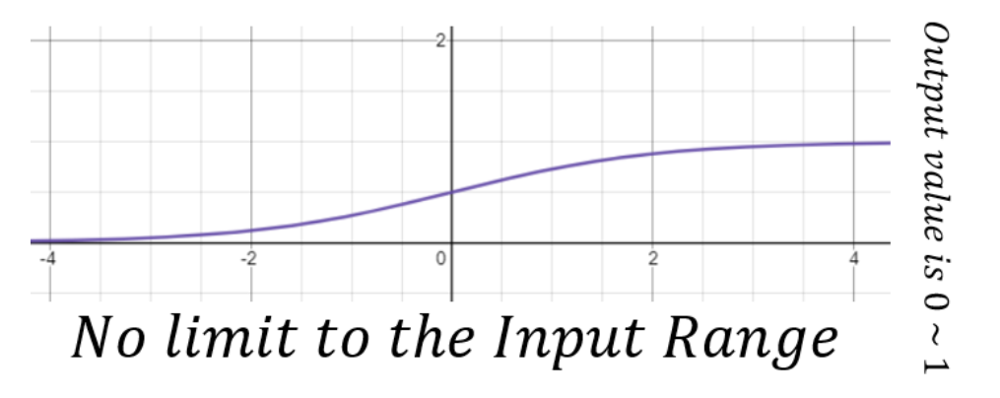

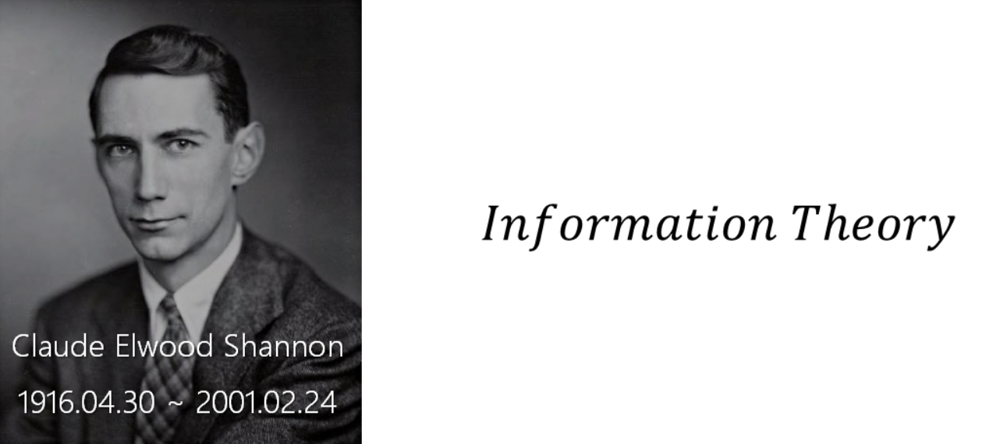

# 엔트로피 (entropy)

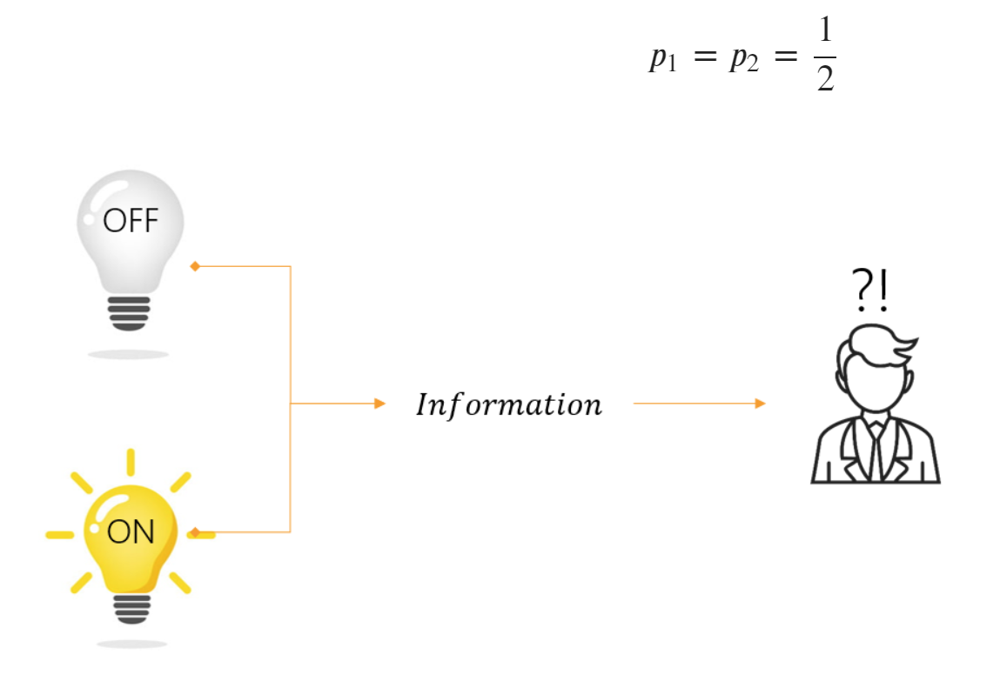

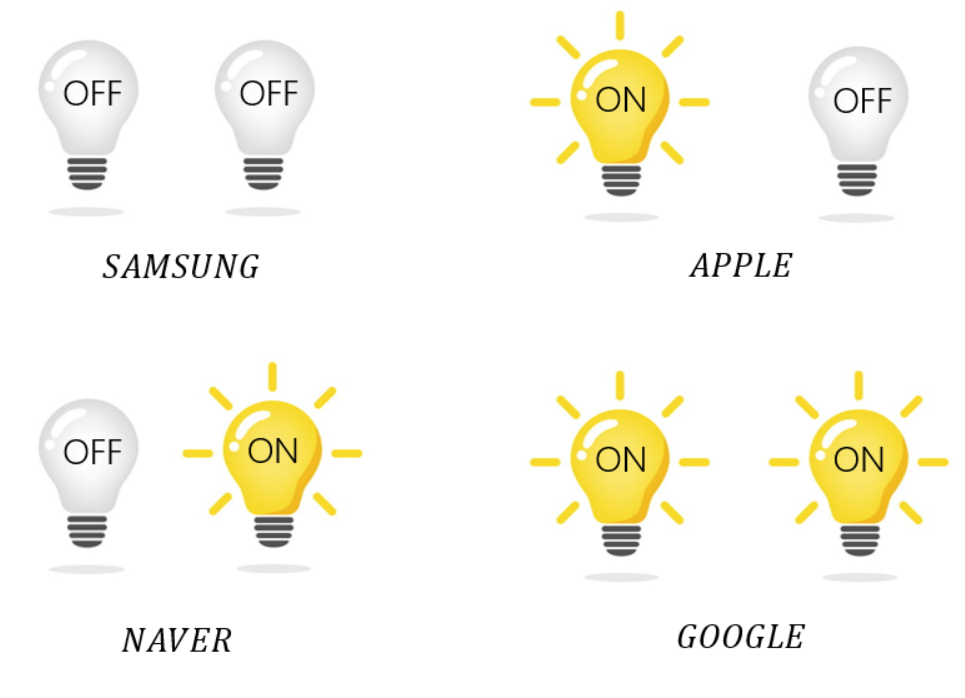

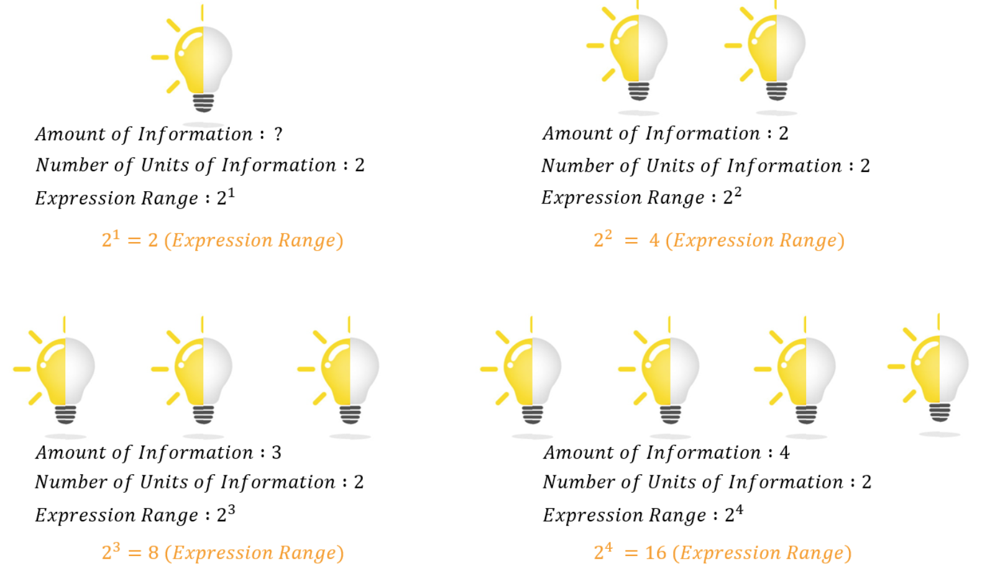

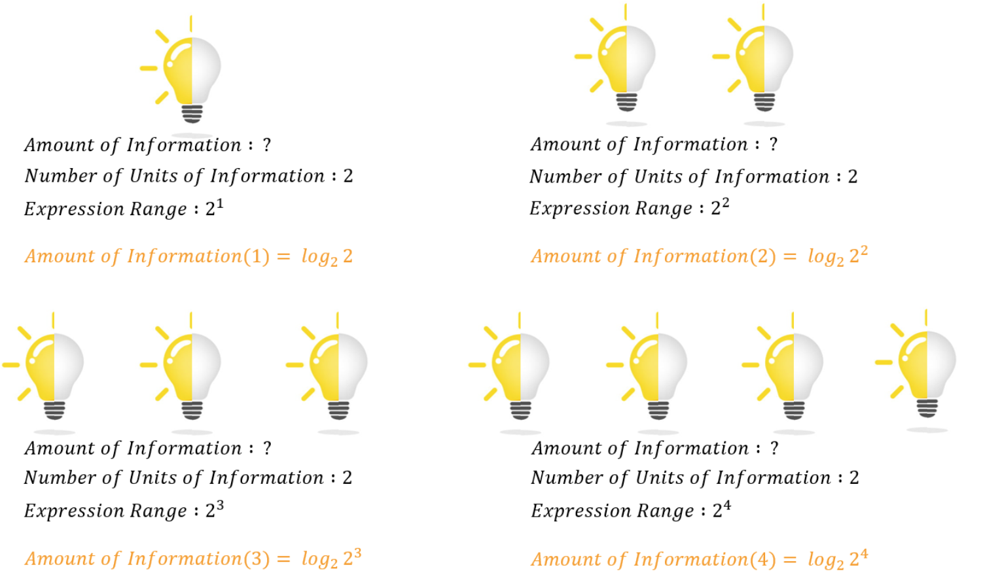

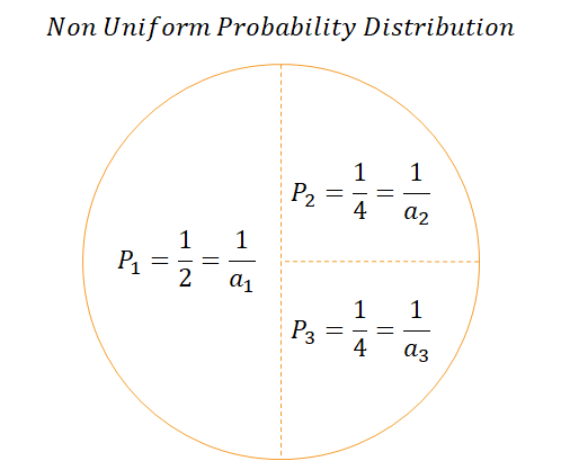

...

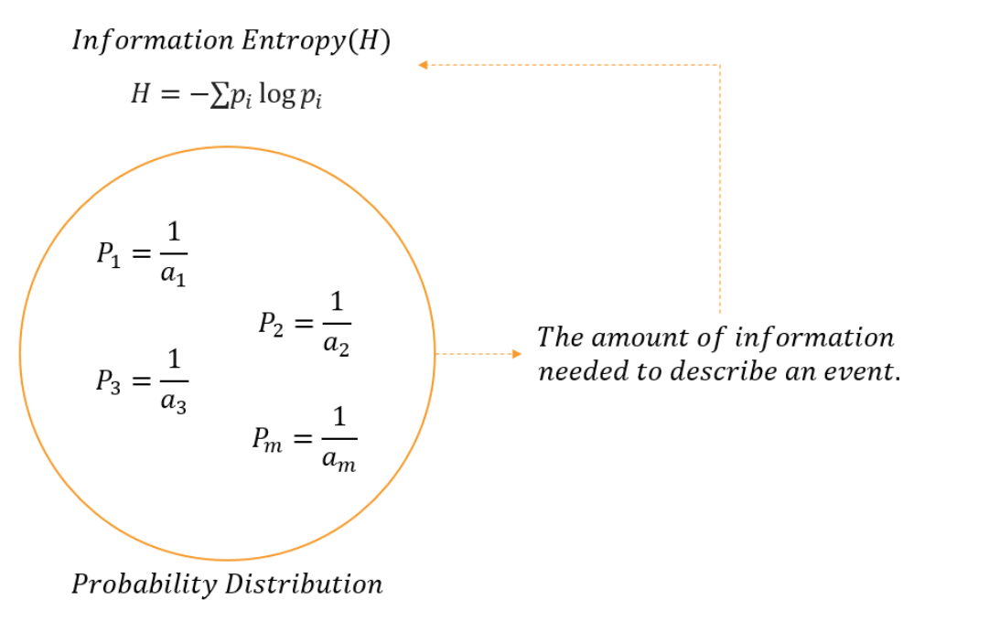

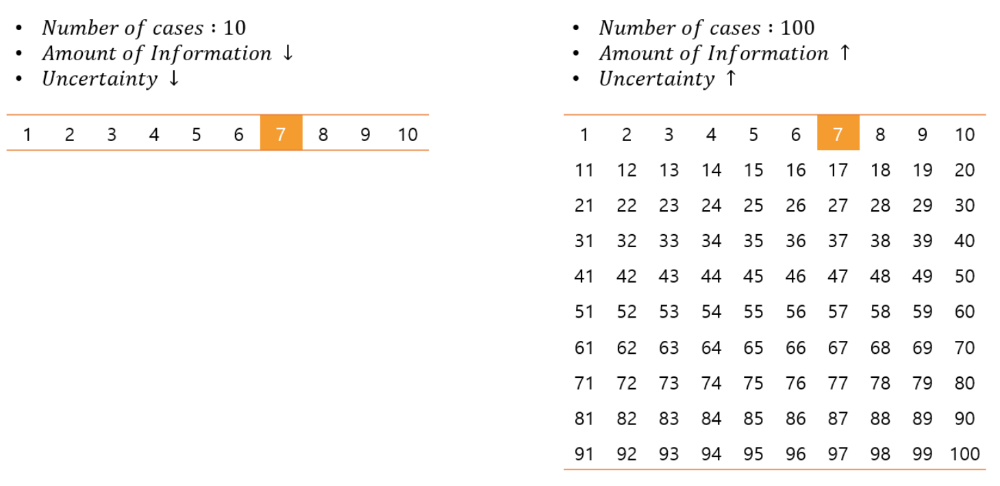

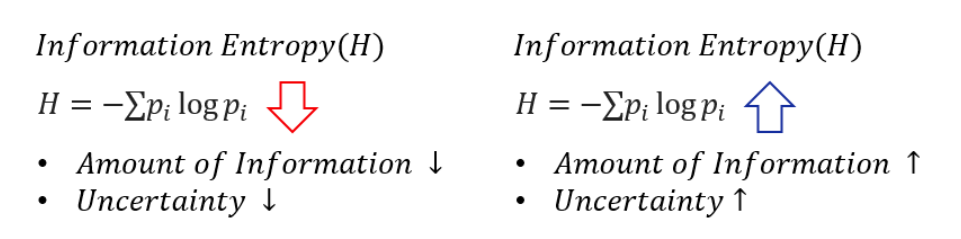

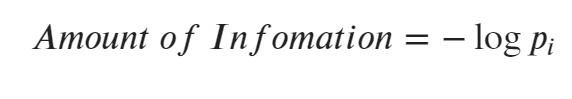

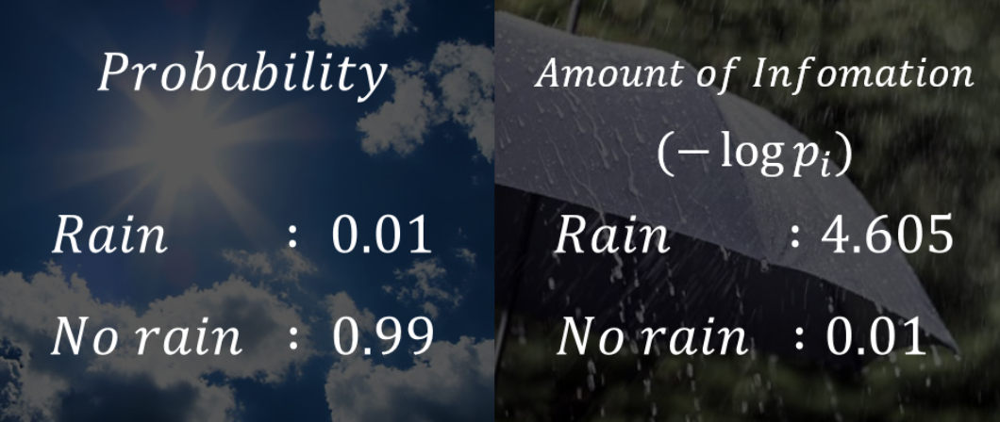

In [3]:
rain_prob = 0.01
no_rain_prob = 0.99

def amount_of_infomation(prob):
    amount_of_info = -np.log(prob)
    return np.round(amount_of_info,3)

In [4]:
H_1 = amount_of_infomation(rain_prob)
H_2 = amount_of_infomation(no_rain_prob)

print("Rain_prob of amount of info : ", H_1)
print("NO_Rain_prob of amount of info : ", H_2)

Rain_prob of amount of info :  4.605
NO_Rain_prob of amount of info :  0.01


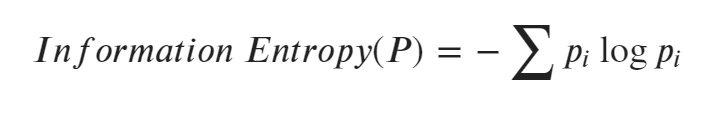

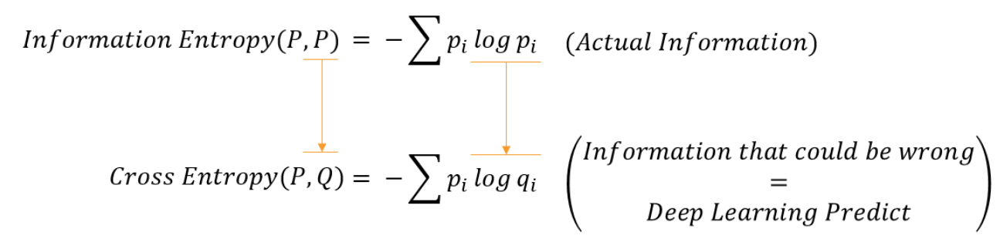

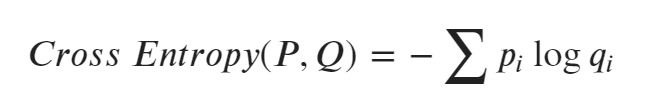

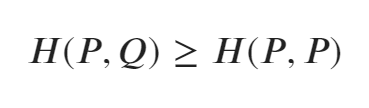

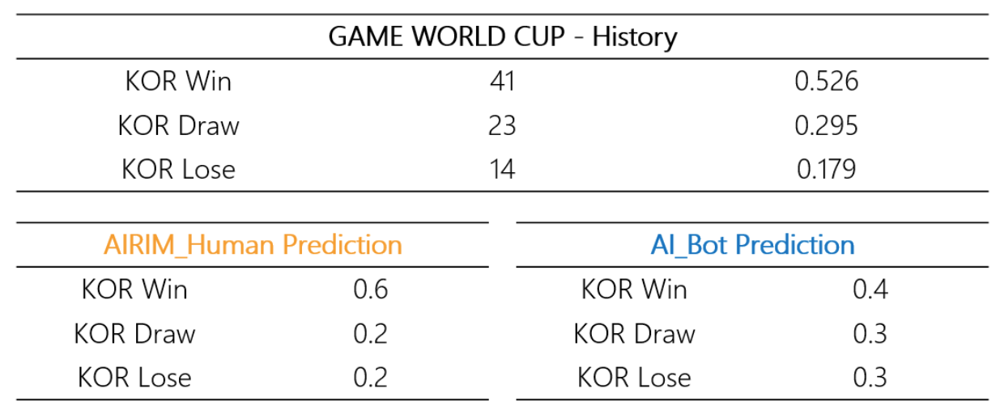

In [5]:
import numpy as np
Real_Prob = np.array([0.526, 0.295, 0.179])
Human_Q   = np.array([0.6, 0.2, 0.2])
AI_Q      = np.array([0.4, 0.3, 0.3])

In [6]:
class Entropy():
    def __init__(self, Prob, Q):
        self.Prob = Prob
        self.Q    = Q

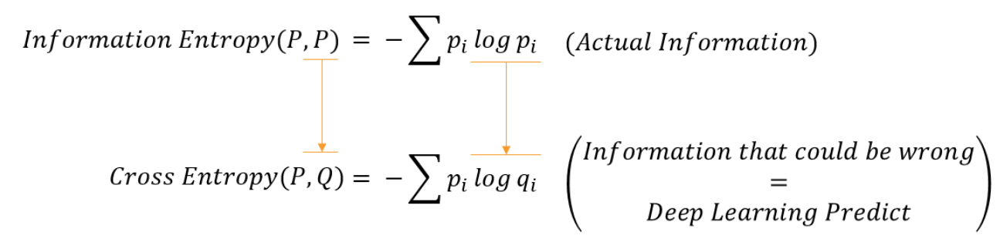

In [8]:
def out_entropy(self, H_Q = True):
    global cross_entropy, info_entropy
    amount_of_info_row = []

    if H_Q == True:
        for i in range(len(self.Q)):
            amount_of_info = -self.Prob[i] * np.log(self.Q[i])
            amount_of_info_row.append(amount_of_info)
        
        cross_entropy = np.sum(amount_of_info_row)
        print("--- cross entropy ---")
        
        return np.round(cross_entropy, 3)

    else:
        for p in self.Prob:
            amount_of_info = - p * np.log(p)
            amount_of_info_row.append(amount_of_info)
            
        info_entropy = np.sum(amount_of_info_row)
        print("---infomation entropy---")

        return np.round(info_entropy, 3)

Entropy.entropy = out_entropy

In [9]:
class_entropy_1 = Entropy(Real_Prob, Human_Q)

In [11]:
Human_info_entropy = class_entropy_1.entropy(H_Q=False)
print(Human_info_entropy)

Human_cross_entropy = class_entropy_1.entropy(H_Q=True)
print(Human_cross_entropy)

---infomation entropy---
1.006
--- cross entropy ---
1.032


In [12]:
class_entropy_2 = Entropy(Real_Prob, AI_Q)
AI_info_entropy = class_entropy_2.entropy(H_Q = False)
print(AI_info_entropy)

AI_cross_entropy = class_entropy_2.entropy(H_Q = True)
print(AI_cross_entropy)

---infomation entropy---
1.006
--- cross entropy ---
1.053


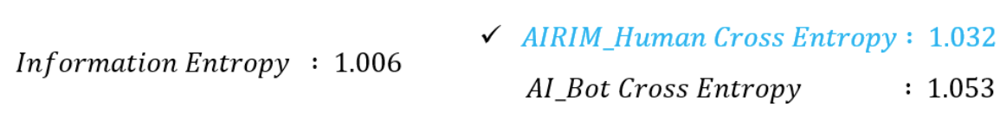

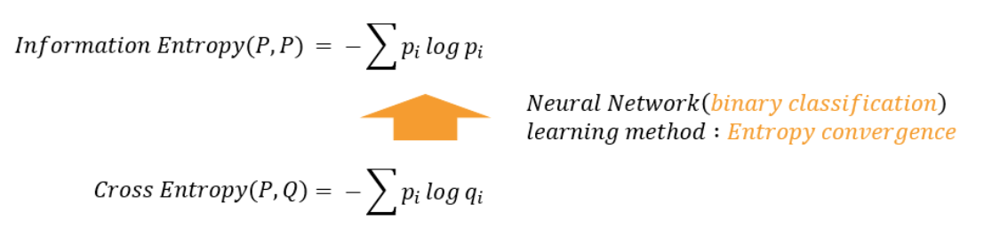

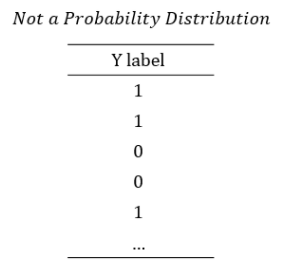

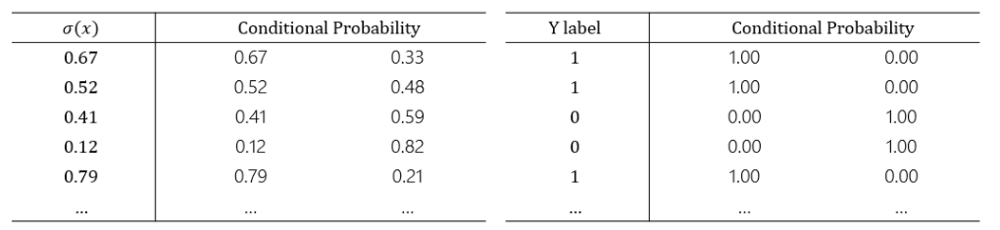

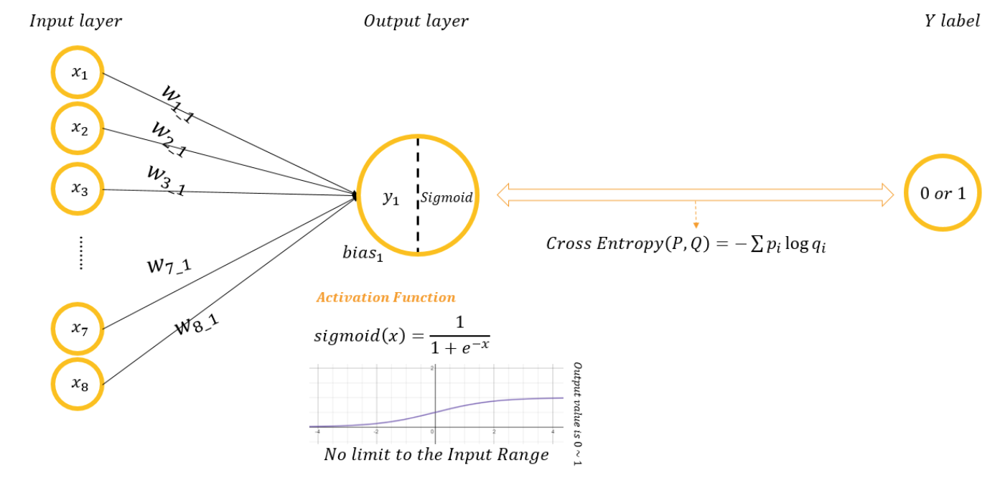

...

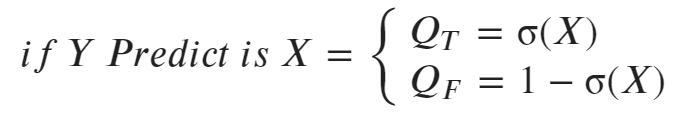

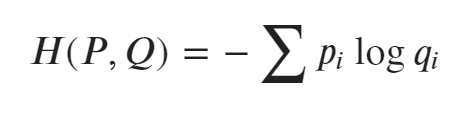

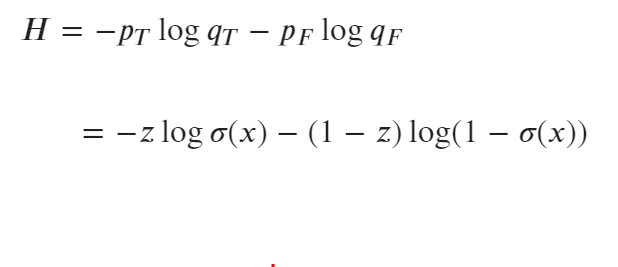

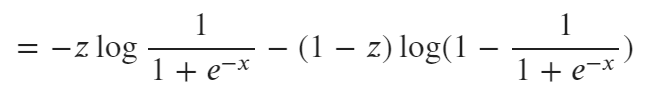

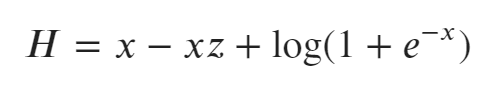

## 이 식의 정리 과정은 다음과 같습니다. 

## $$ H = -z \log \frac{1}{1+e^{-x}} - (1-z)\log (1-\frac{1}{1+e^{-x}}) $$

## $$ = -z \log \frac{1}{1+e^{-x}} - (1-z)\log(\frac{e^{-x}}{1+e^{-x}}) $$ 
#### $$ (※ \log{a} \frac{X}{Y} = \log{a} \ X - \log{a} \ Y )$$

## $$ \qquad \qquad = z\log (1+ e^{-x}) - (1 - z)(\log e^{-x} - \log(1 + e^{-x})) $$  

## $$ \qquad \qquad \qquad \; \; = z \log(1 + e^{-x})-(1-z)\log e^{-x} + (1 - z)\log(1+e^{-x})$$
## $$※ like \ terms$$
## $$ \quad = (z + 1 - z)\log(1+e^{-x}) - (1-z)\log e^{-x}$$
## $$ = (z+1-z)\log(1+e^{-z}) - (1-z)(-x) $$
### $$ (※ \log_{a}{X^{p}} = p \log_a X) $$
## $$ = x-xz + \log(1+e^{-x}) \! \qquad \qquad \qquad \quad$$

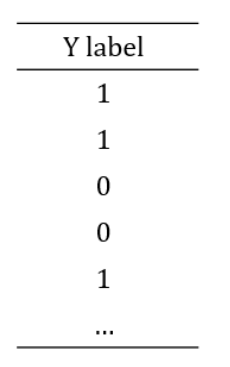

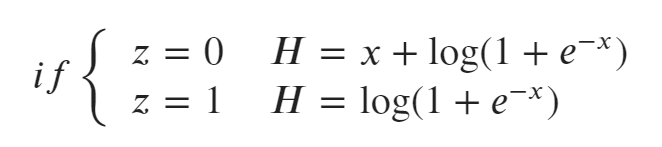

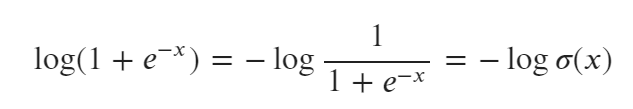

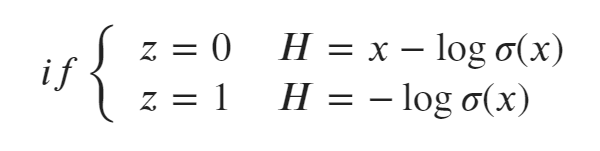

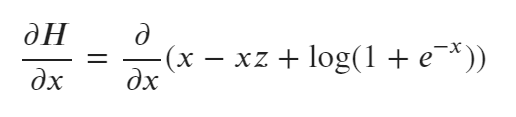

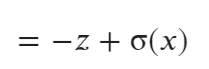

## $$ \frac{∂H}{∂x} = \; \frac{∂}{∂x}(x - xz + \log(1 + e^{-x}))$$ 

## $$  = 1 - z + \frac{(1+e^{-x})'}{1+e^{-x}} \! \quad \;$$ 
#### $$ (※ y = \log_{e} f(x)  \Rightarrow y' = \frac{f'(x)}{f(x)}) $$
## $$  = 1 - z + \frac{-e^{-x}}{1+e^{-x}} \! \qquad  $$ 

## $$ ※ \begin{cases}(e^{-x})' = -e^{-x} \\(e^{x})' = e^{x})\end{cases} $$

## $$ = -z + 1 + \frac{-e^{-x}}{1+e^{-x}} \! \quad \;$$
## $$ \quad \quad  = -z + \frac{1+e^{-x}}{1+e^{-x}} + \frac{-e^{-x}}{1+e^{-x}} $$
## $$ \quad \; \; = -z + \frac{1+e^{-x} + (-e^{-x})} {1+e^{-x}}$$
## $$ = -z + \frac{1}{1+e^{-x}} \qquad \; \; $$
## $$ = -z + σ(x) \! \qquad \qquad \; $$

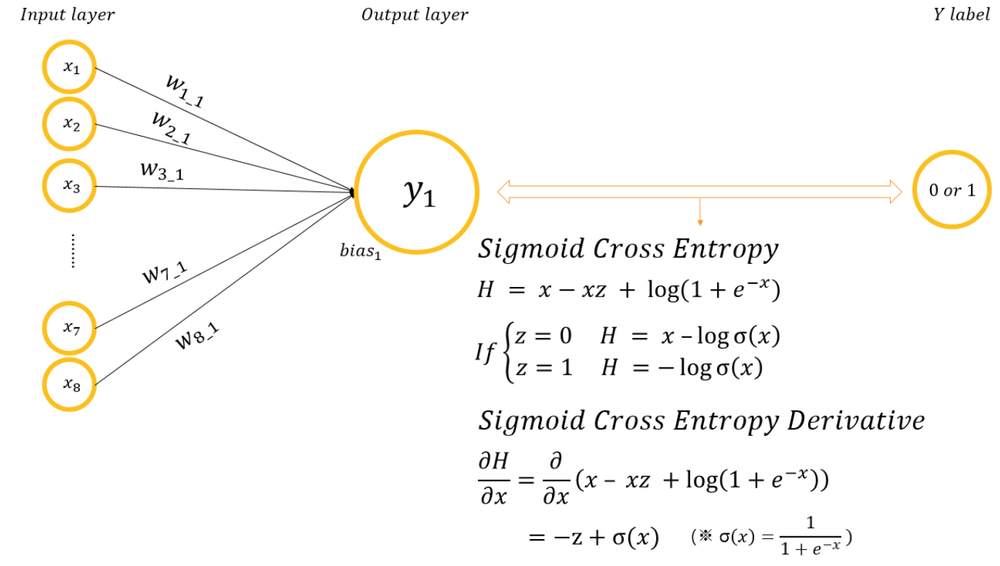

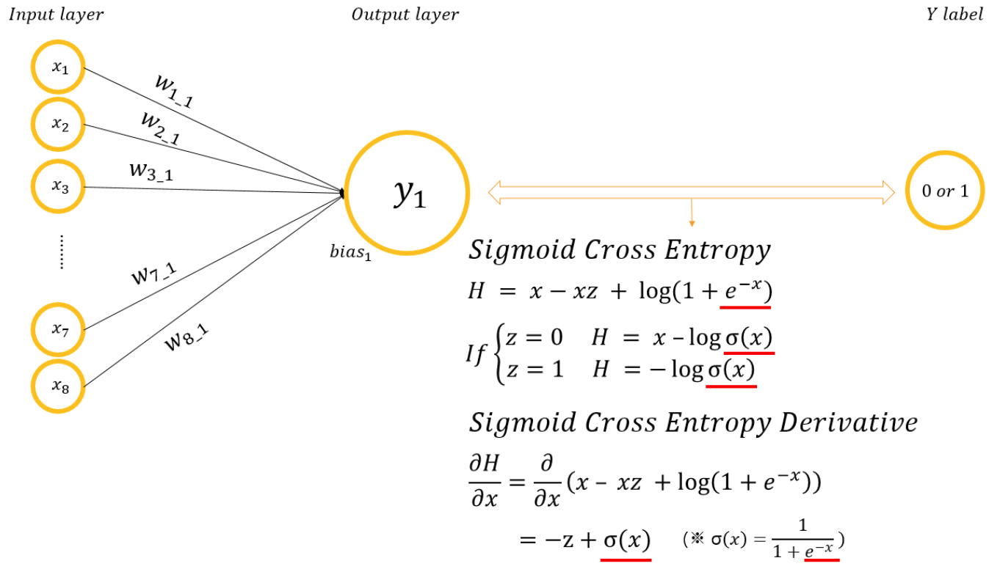

In [24]:
def sigmoid_A(x):
    y = 1.0 / (1.0 + np.exp(-x))
    print(y)

In [31]:
sigmoid_A(1000)
#sigmoid_A(-1000)
sigmoid_A(0)

1.0
0.5


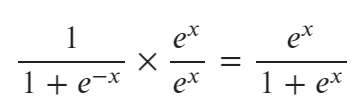

In [32]:
def sigmoid_B(x):
    y = np.exp(x) / (1.0 + np.exp(x))
    print(y)

sigmoid_B(-1000)
#sigmoid_B(1000)
sigmoid_B(0)

0.0
0.5


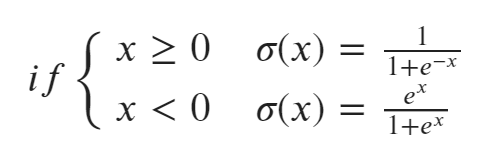

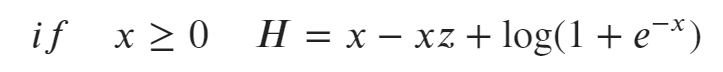

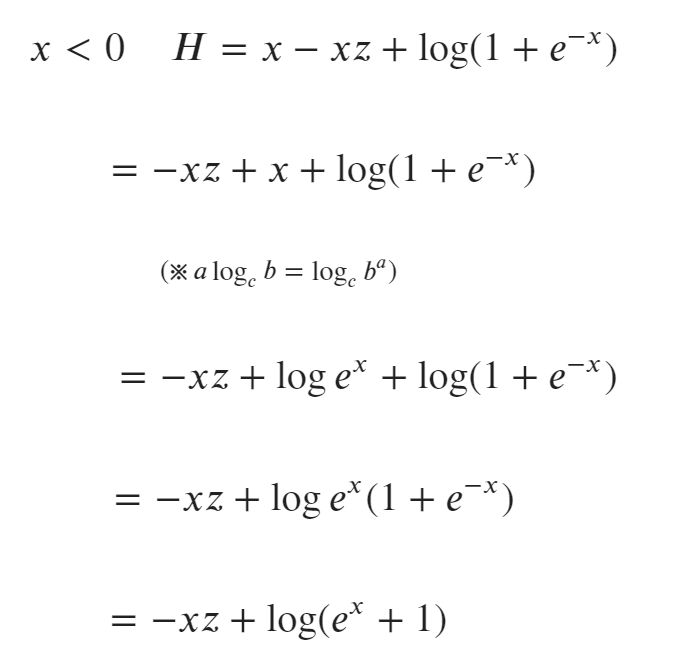

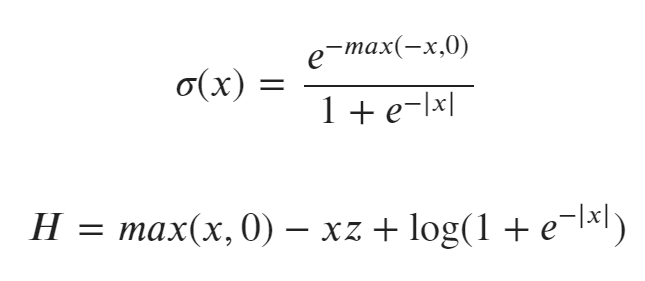

In [33]:
def relu(x):
    return np.maximum(x,0)

In [38]:
def sigmoid_C(x):
    result = np.exp(-relu(-x)) / (1.0 + np.exp(-np.abs(x)))
    print(result)

In [39]:
x_list = [1000, -1000, 0]

for x in x_list:
    sigmoid_C(x)

1.0
0.0
0.5


In [40]:
def H_A(x,z):
    result = x - x * z + np.log(1 + np.exp(-x))
    print(result)

def H_B(x,z):
    result = - x * z + np.log(np.exp(x) + 1)
    print(result)

def H_C(x,z):
    result = relu(x) - x * z + np.log(1 + np.exp(-np.abs(x)))
    print(result)

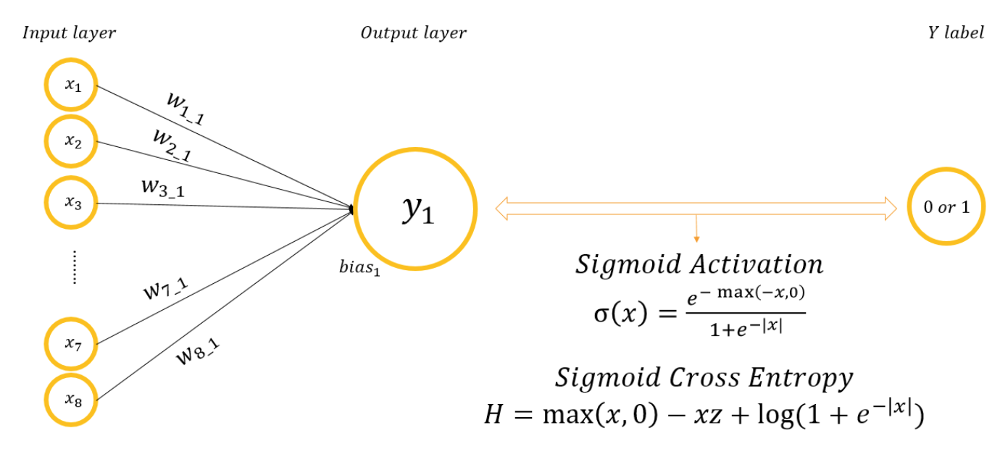

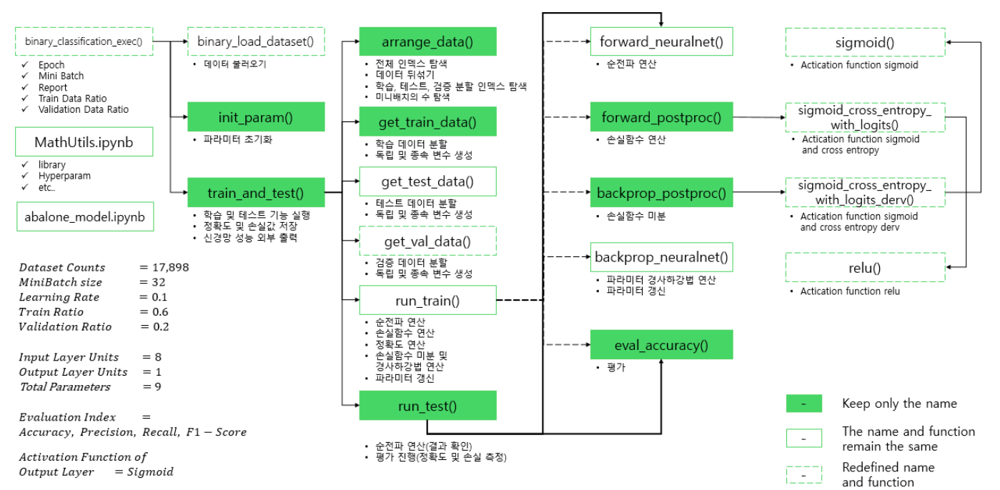